# How to Train YOLOv5s on Bdd100k datasets


### Steps Covered in this Tutorial


To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Evaluate datasets
* Download YOLOv5 pre-trained weight
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images


# Install Dependencies


In [1]:
!pip install -r requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.5.1 _CudaDeviceProperties(name='GeForce GTX 1070', major=6, minor=1, total_memory=8117MB, multi_processor_count=16)


# Evaluate datasets

In [2]:
import glob, os,shutil

labels_list=glob.glob("bdd100k/labels/trains"+"/"+"*.txt")
images_list=glob.glob("bdd100k/images/trains"+"/"+"*.jpg")
print(len(labels_list))
print(len(images_list))

labels_list2=glob.glob("bdd100k/labels/valids"+"/"+"*.txt")
images_list2=glob.glob("bdd100k/images/valids"+"/"+"*.jpg")
print(len(labels_list2))
print(len(images_list2))

69863
69863
10000
10000


In [3]:
import cv2
import matplotlib.pyplot as plt 

img = cv2.imread("bdd100k/images/valids/b1d4b62c-89eeb5d3.jpg")
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


with open("bdd100k/labels/valids/b1d4b62c-89eeb5d3.txt", "rt") as f:
    data_lines = f.readlines()

bboxes=[]
w=1280
h=720
for item in range(len(data_lines)):
    cl=int(data_lines[item].split(" ")[0])
    a=float(data_lines[item].split(" ")[1])
    b=float(data_lines[item].split(" ")[2])
    c=float(data_lines[item].split(" ")[3])
    d=float(data_lines[item].split(" ")[4][:-1])
    
    x1 = int((a-c/2)*w)
    y1 = int((b-d/2)*h)
    x2 = int((a+c/2)*w)
    y2 = int((b+d/2)*h)
    
    bboxes.append([x1,y1,x2,y2,cl])
    
print(bboxes)


[[952, 227, 1000, 242, 11], [67, 242, 90, 281, 7], [960, 257, 977, 301, 7], [1185, 324, 1223, 355, 7], [1171, 233, 1204, 284, 8], [565, 388, 678, 485, 2], [752, 410, 845, 482, 2], [716, 414, 757, 478, 2], [695, 432, 717, 479, 2], [682, 443, 696, 474, 2], [424, 437, 501, 475, 2], [517, 441, 563, 471, 2]]


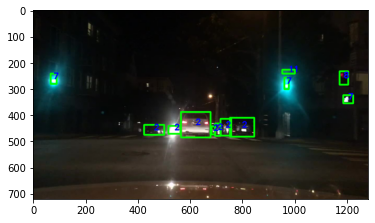

In [4]:
for c in bboxes:
    cv2.rectangle(img, (c[0],c[1]), (c[2], c[3]), (0, 255, 0), 5)
    cv2.putText(img, str(c[4]), (int((c[0]+c[2])/2), int((c[1]+c[3])/2)), 0, 1, (0, 0, 255),3)
    
plt.imshow(img)
plt.show()

In [5]:
# write your own YAML file
%cat models/uc_data.yaml

train: bdd100k/images/trains
val: bdd100k/images/valids
test: bdd100k/images/test

nc: 13
names: ['person','rider','car','bus','truck','bike','motor','tl_green','tl_red','tl_yellow','tl_none','t_sign','train']


# Download YOLOv5 pre-trained weight

In [ ]:
!weights/download_weights.sh

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

### Train from scratch

In [ ]:
torch.cuda.empty_cache()
%time
!python train.py --img 640 --batch 32 --epochs 300 --data './models/uc_data.yaml' --cfg ./models/custom_yolov5s.yaml --weights "" --name yolov5s_bdd  --cache 

### Train with pre-trained weight

In [ ]:
torch.cuda.empty_cache()
%time
!python train.py --img 640 --batch 32 --epochs 300 --data './models/uc_data.yaml' --cfg ./models/custom_yolov5s.yaml --weights "./weights/yolov5s.pt" --name yolov5s_bdd_prew  --cache 


# Evaluate Custom YOLOv5 Detector Performance

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

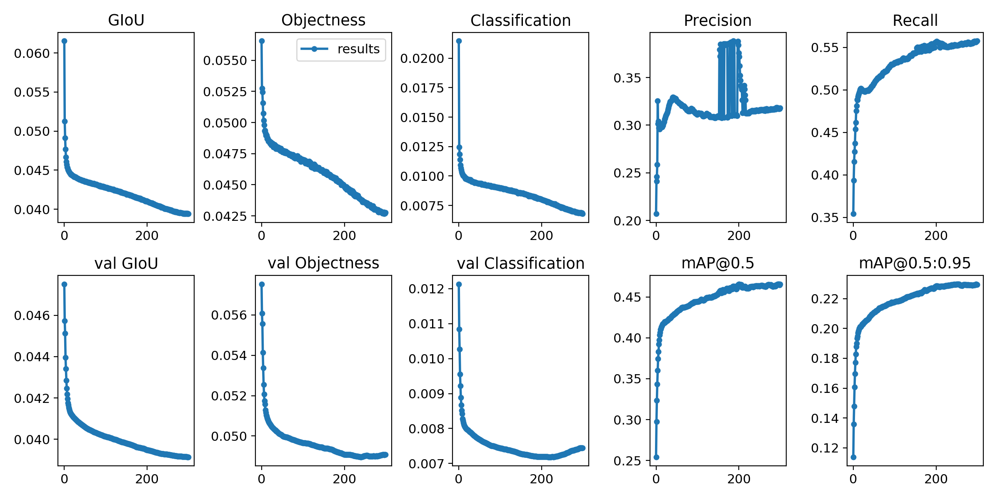

In [7]:
# Train from scratch
Image(filename='runs/exp0_yolov5s_bdd_prew/results.png', width=1000)  # view results.png

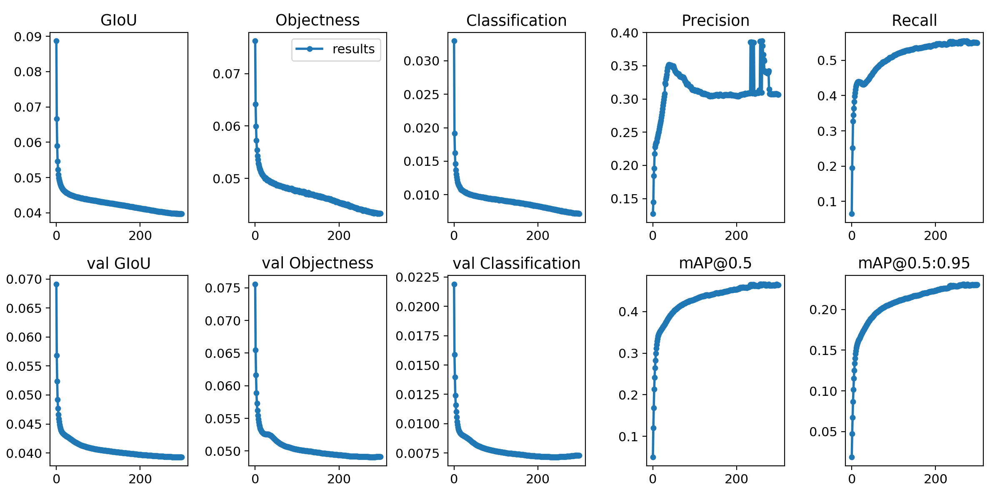

In [8]:
# Train with pre-trained weight
Image(filename='runs/exp1_yolov5s_bdd/results.png', width=1000)  # view results.png

# Visualize YOLOv5 training data

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


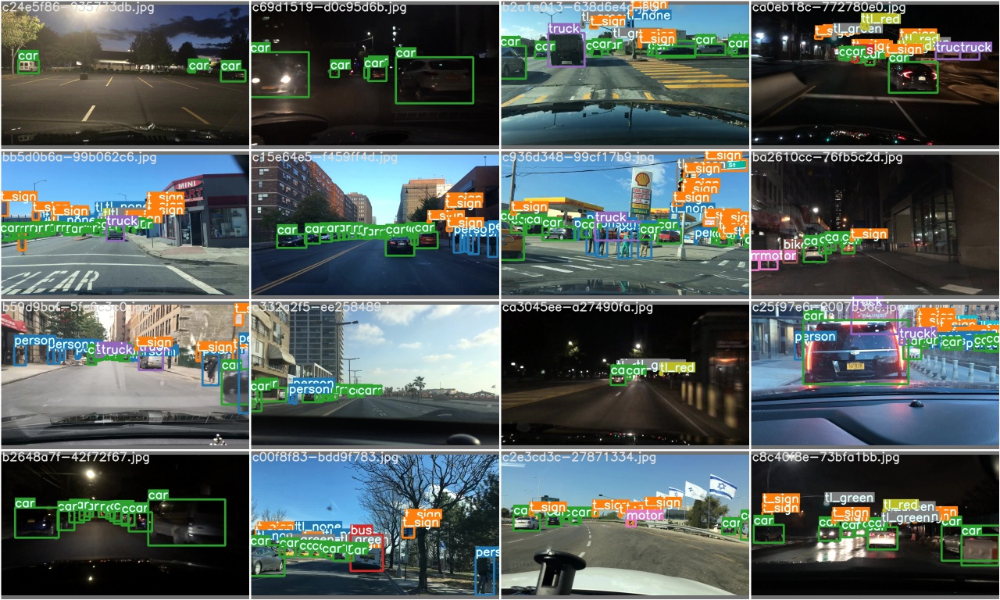

In [9]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='runs/exp0_yolov5s_bdd_prew/test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


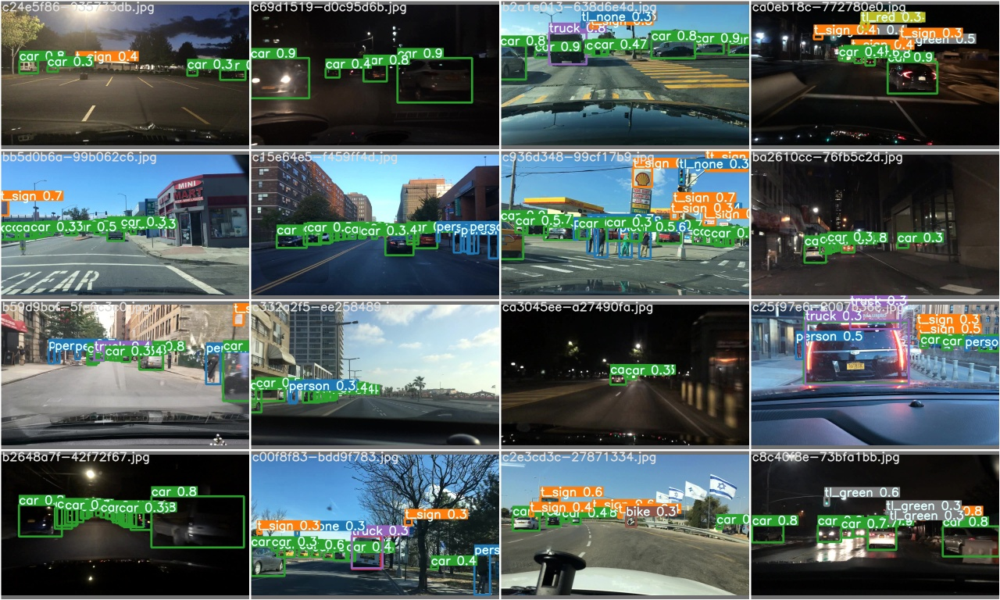

In [10]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='runs/exp0_yolov5s_bdd_prew/test_batch0_pred.jpg', width=900)

# Run Inference  With Trained Weights


In [11]:
# trained weights are saved by default in our weights folder
%ls runs/exp0_yolov5s_bdd_prew/weights/

best_yolov5s_bdd_prew.pt  last_yolov5s_bdd_prew.pt


In [ ]:
!python detect.py --weights runs/exp0_yolov5s_bdd_prew/weights/best_yolov5s_bdd_prew.pt  --source bdd100k/images/test  --save-txt

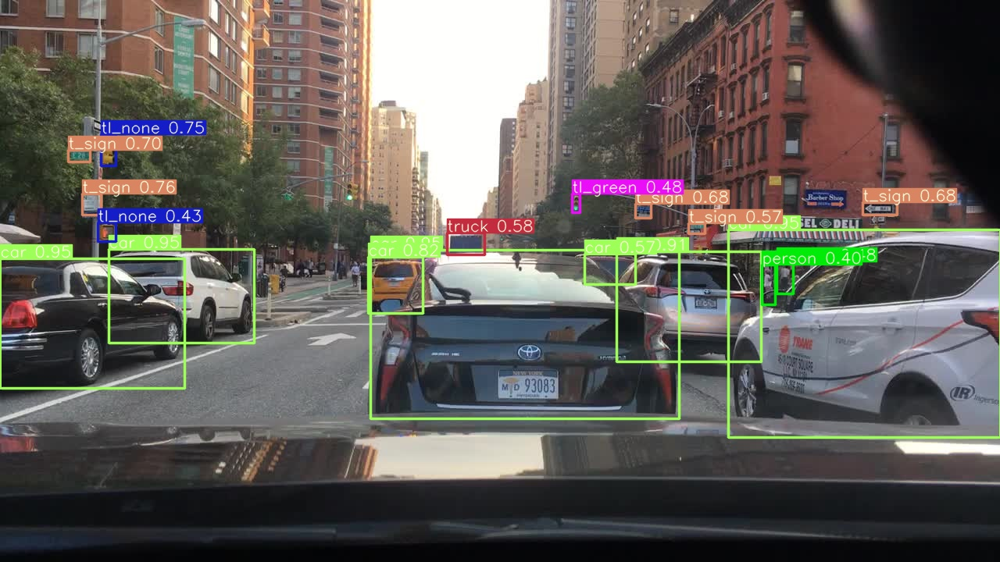

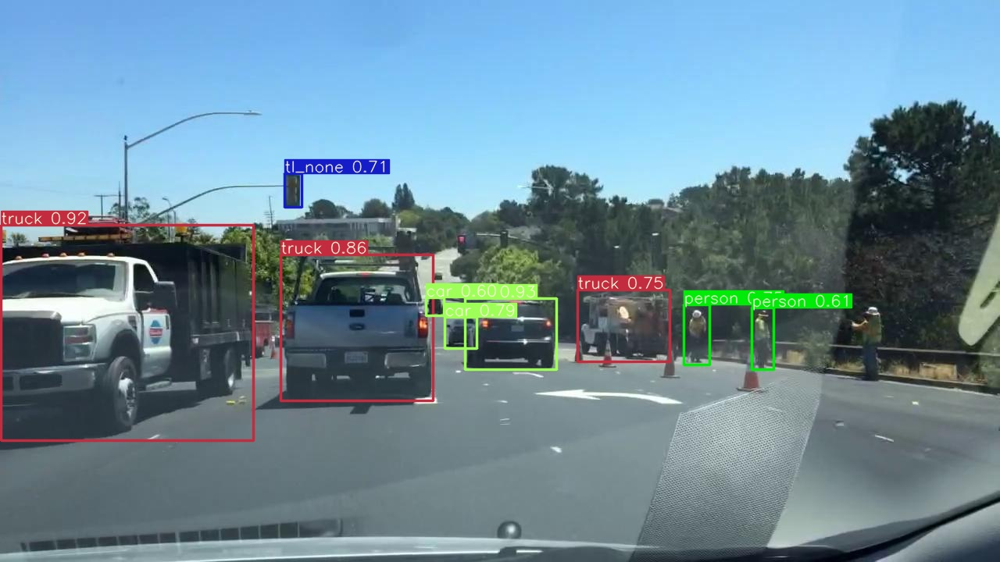

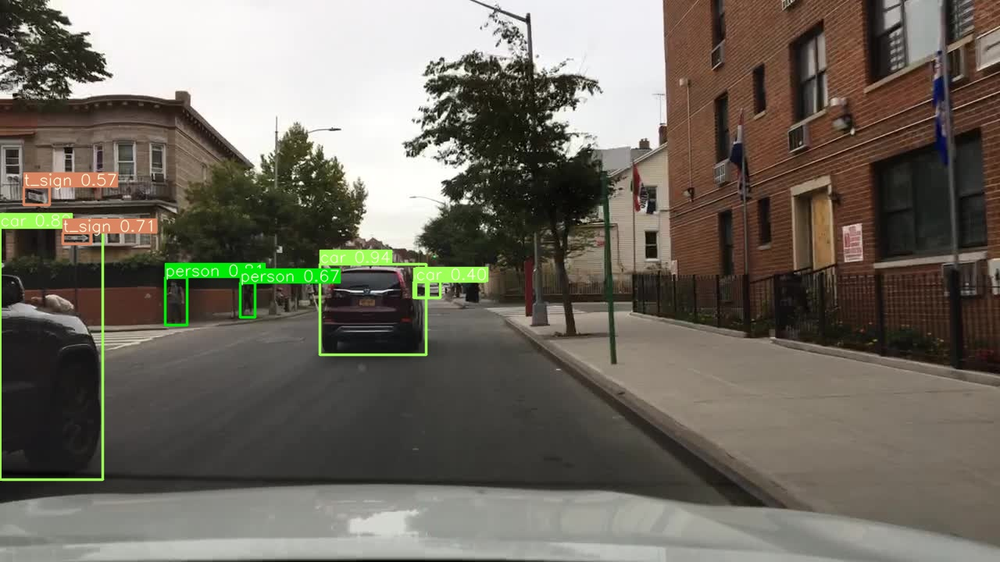

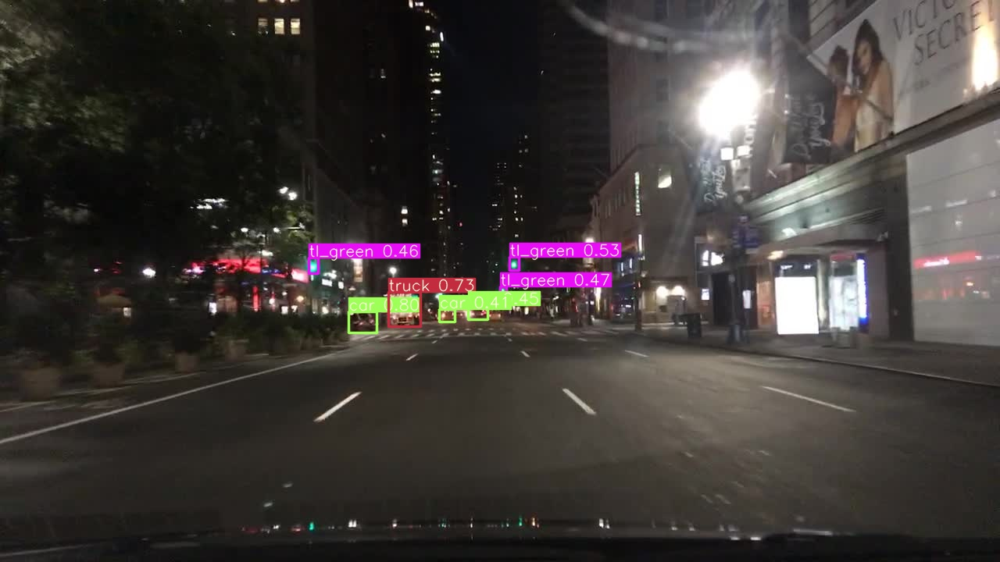

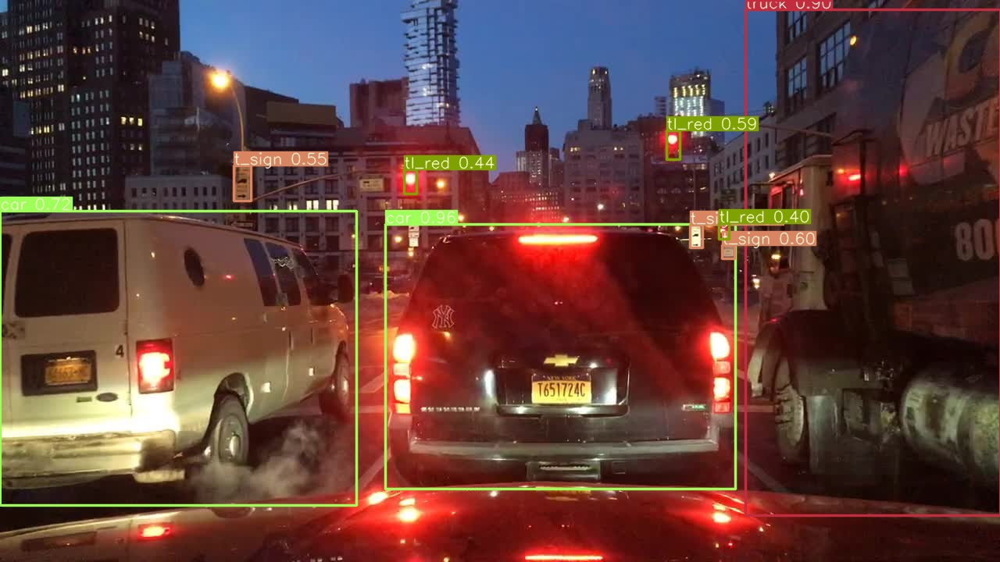

...

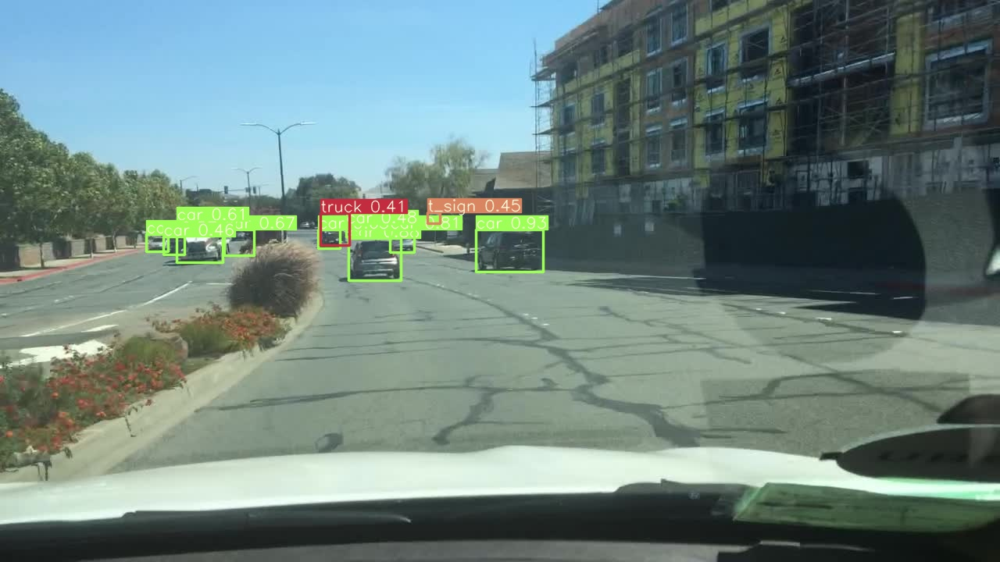

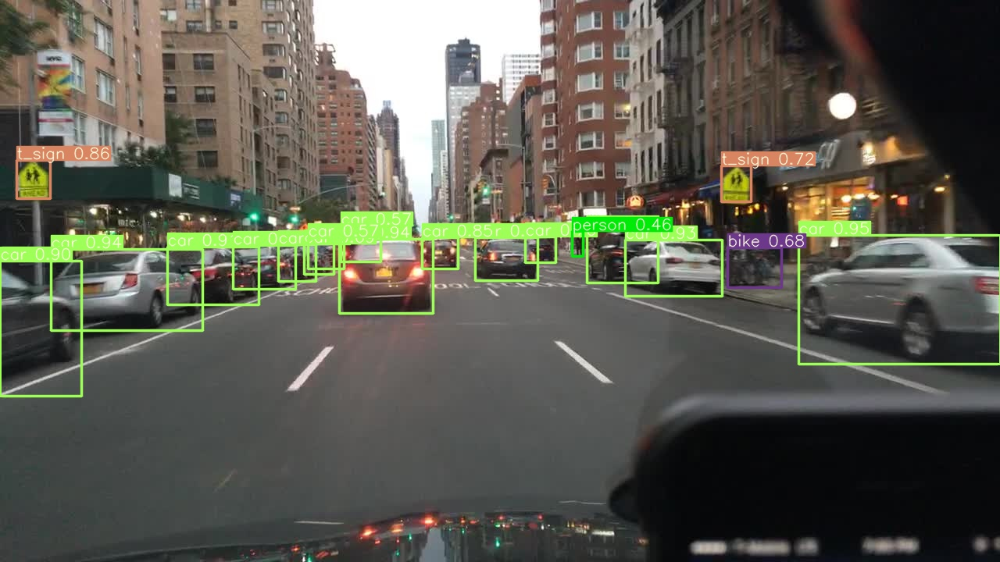

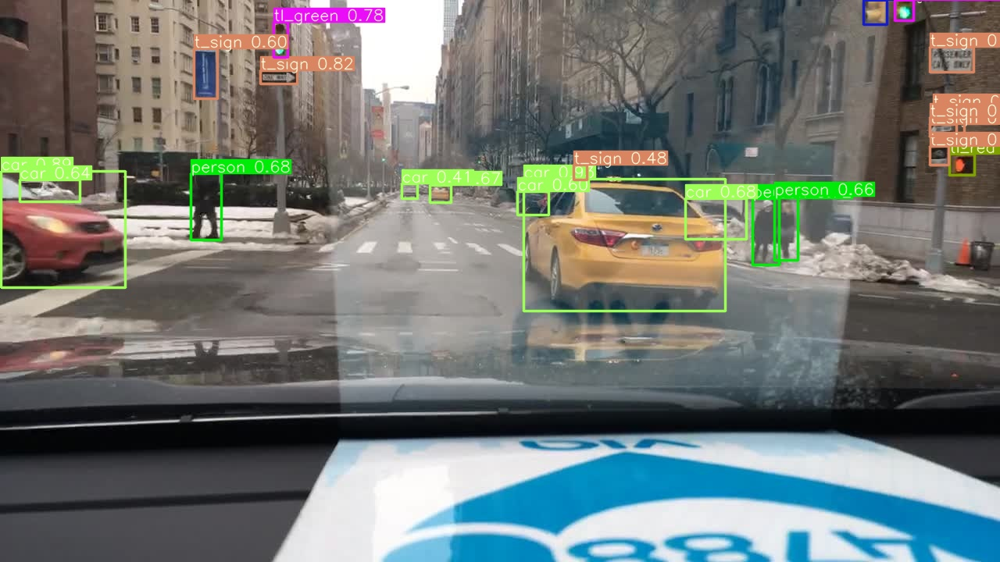

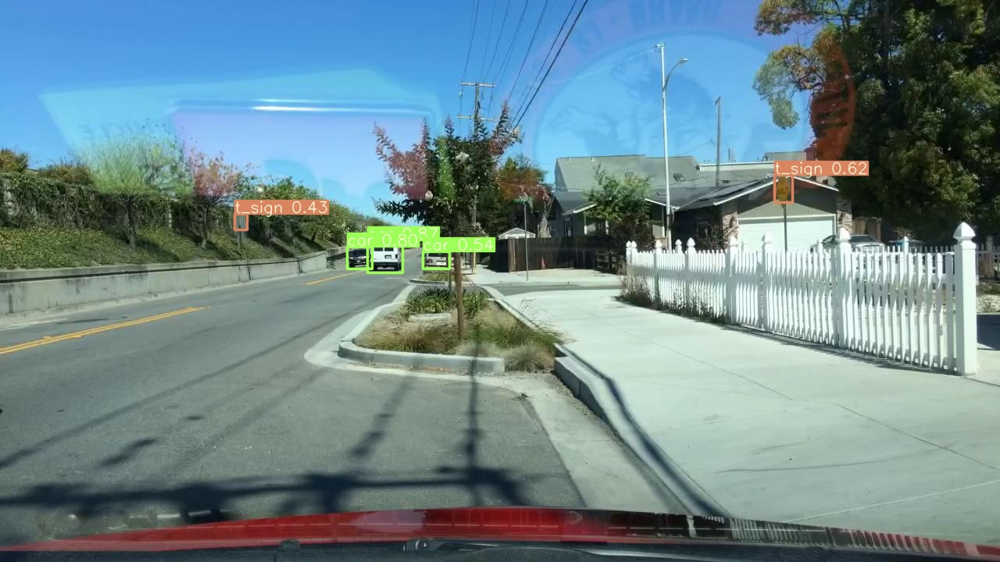

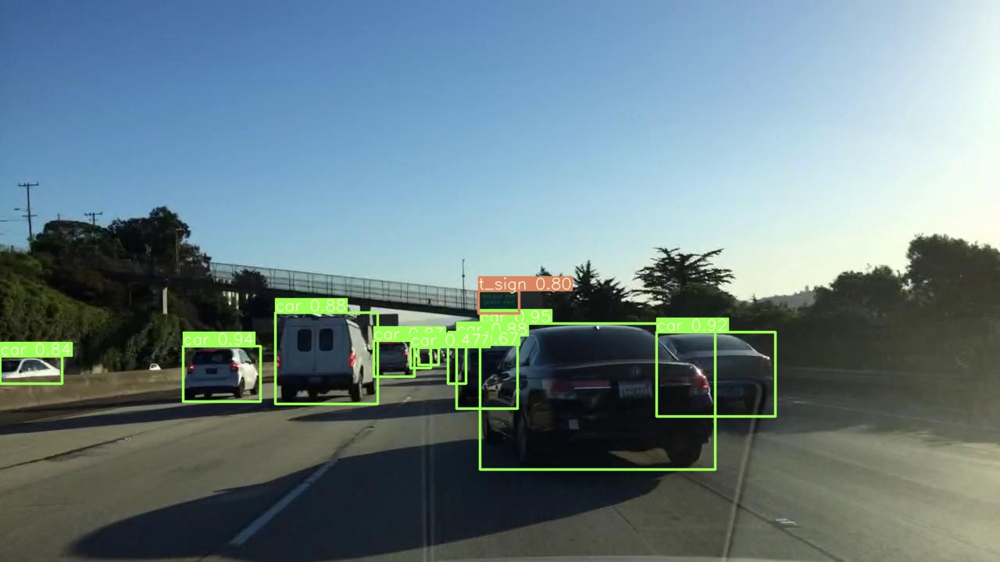

In [12]:
#display inference on ALL test images
import glob
from random import sample
from IPython.display import Image, display
test_list=sample(glob.glob('inference/output/*.jpg'),20)
for imageName in test_list: #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [14]:
!python detect.py --weights runs/exp0_yolov5s_bdd_prew/weights/best_yolov5s_bdd_prew.pt  --source bdd100k/test.mp4

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='bdd100k/test.mp4', update=False, view_img=False, weights=['runs/exp8_yolov5s_bdd/weights/best_yolov5s_bdd.pt'])
Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2080 Ti', total_memory=11016MB)

Fusing layers... Model Summary: 140 layers, 7.27888e+06 parameters, 6.61683e+06 gradients
video 1/1 (1/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (2/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (3/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 1 trucks, Done. (0.008s)
video 1/1 (4/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (5/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (6/4592

video 1/1 (81/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (82/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (83/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (84/45922) bdd100k/test.mp4: 384x640 6 persons, 10 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (85/45922) bdd100k/test.mp4: 384x640 6 persons, 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (86/45922) bdd100k/test.mp4: 384x640 5 persons, 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (87/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 1 buss, 1 trucks, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (88/45922) bdd100k/test.mp4: 384x640 6 persons, 10 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (89/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (90/45922) bdd100k/test.mp

video 1/1 (163/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (164/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (165/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (166/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (167/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (168/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (169/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (170/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (171/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (172/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (173/45922

video 1/1 (250/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (251/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (252/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (253/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (254/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (255/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (256/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (257/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 2 buss, 2 t_signs, Done. (0.007s)
video 1/1 (258/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (259/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 2 buss, 3 t_signs, D

video 1/1 (332/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (333/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (334/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (335/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (336/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (337/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (338/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (339/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (340/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (341/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 5 t_signs, Done. (0.007s

video 1/1 (413/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.010s)
video 1/1 (414/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.009s)
video 1/1 (415/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (416/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (417/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (418/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (419/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (420/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (421/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (422/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 1 buss, 1 t_signs, Done.

video 1/1 (492/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (493/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (494/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (495/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (496/45922) bdd100k/test.mp4: 384x640 5 persons, 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (497/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (498/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (499/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (500/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (501/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 3 t_signs, Done. (

video 1/1 (574/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (575/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (576/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (577/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (578/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 tl_reds, 2 t_signs, Done. (0.009s)
video 1/1 (579/45922) bdd100k/test.mp4: 384x640 6 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (580/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (581/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 1 buss, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (582/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (583/45922) 

video 1/1 (656/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (657/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (658/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (659/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (660/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (661/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (662/45922) bdd100k/test.mp4: 384x640 6 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (663/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (664/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, 1 tl_reds, Done. (0.007s)
video 1/1 (665/45922) bdd100k/test.mp4: 384x640 6 persons, 8 cars, 1 buss, 1 tl_reds, Done. (0.007s)
video 1/1 (666/45922) bdd100k/test.mp4: 384x640 5 pers

video 1/1 (747/45922) bdd100k/test.mp4: 384x640 6 persons, 7 cars, Done. (0.008s)
video 1/1 (748/45922) bdd100k/test.mp4: 384x640 6 persons, 7 cars, Done. (0.007s)
video 1/1 (749/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.010s)
video 1/1 (750/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, Done. (0.007s)
video 1/1 (751/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.007s)
video 1/1 (752/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.007s)
video 1/1 (753/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.007s)
video 1/1 (754/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.007s)
video 1/1 (755/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, Done. (0.007s)
video 1/1 (756/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, Done. (0.007s)
video 1/1 (757/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, Done. (0.007s)
video 1/1 (758/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, 1 tl_reds, 1 t_signs, Done. (0.

video 1/1 (838/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_reds, Done. (0.008s)
video 1/1 (839/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (840/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.009s)
video 1/1 (841/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (842/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (843/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.019s)
video 1/1 (844/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, Done. (0.009s)
video 1/1 (845/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (846/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (847/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (848/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, Don

video 1/1 (927/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (928/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (929/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (930/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (931/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (932/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (933/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (934/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (935/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (936/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (937/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 t

video 1/1 (1016/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1017/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1018/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1019/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1020/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.010s)
video 1/1 (1021/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1022/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.008s)
video 1/1 (1023/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1024/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1025/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1026/45922) bdd100k/test.mp4: 384x640 1 persons,

video 1/1 (1104/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1105/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (1106/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1107/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1108/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1109/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1110/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1111/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1112/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (1113/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (1114/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)

video 1/1 (1196/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1197/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1198/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1199/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1200/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1201/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1202/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1203/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1204/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1205/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1206/45922) bdd100k/test.mp4:

video 1/1 (1283/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1284/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, Done. (0.007s)
video 1/1 (1285/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1286/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1287/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, Done. (0.007s)
video 1/1 (1288/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, Done. (0.007s)
video 1/1 (1289/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1290/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1291/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1292/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1293/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens

video 1/1 (1370/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, Done. (0.007s)
video 1/1 (1371/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1372/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1373/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1374/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, Done. (0.007s)
video 1/1 (1375/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1376/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1377/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, Done. (0.007s)
video 1/1 (1378/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1379/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, Done. (0.007s)
video 1/1 (1380/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_greens, Don

video 1/1 (1457/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, Done. (0.007s)
video 1/1 (1458/45922) bdd100k/test.mp4: 384x640 6 persons, 6 cars, 1 buss, Done. (0.007s)
video 1/1 (1459/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1460/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1461/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, Done. (0.007s)
video 1/1 (1462/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1463/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1464/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, Done. (0.007s)
video 1/1 (1465/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1466/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1467/45922) bdd100k/test.

video 1/1 (1543/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1544/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1545/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1546/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1547/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1548/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1549/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1550/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1551/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1552/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (1553/45922) bdd100k/test.mp4:

video 1/1 (1625/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 7 cars, 1 bikes, 1 motors, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1626/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 7 cars, 1 bikes, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (1627/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 7 cars, 1 bikes, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (1628/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 6 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1629/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1630/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 6 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1631/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 7 cars, 1 motors, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1632/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 6 cars, 1 bikes, 1 motors, 1 tl_green

video 1/1 (1691/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1692/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 9 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1693/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1694/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1695/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 9 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1696/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1697/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1698/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (169

video 1/1 (1760/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 9 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1761/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1762/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1763/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1764/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1765/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1766/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1767/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 8 cars, 1 bikes, 1 tl_greens, Done. (0.007s)
video 1/1 (1768/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 8 cars, 1 

video 1/1 (1826/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1827/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (1828/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1829/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1830/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1831/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1832/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1833/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1834/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1835/45922) b

video 1/1 (1905/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (1906/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (1907/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 tl_greens, Done. (0.007s)
video 1/1 (1908/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1909/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1910/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1911/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1912/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (1913/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. 

video 1/1 (1976/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1977/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1978/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1979/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1980/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (1981/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (1982/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1983/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (1984/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 tl_greens, Done. (

video 1/1 (2054/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2055/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2056/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2057/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2058/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2059/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2060/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2061/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2062/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2063/45922) bdd100k/test.m

video 1/1 (2133/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2134/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2135/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (2136/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2137/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (2138/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (2139/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2140/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (2141/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (2142/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_greens, 1 t_signs, 

video 1/1 (2210/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2211/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2212/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (2213/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 buss, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2214/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2215/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2216/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2217/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2218/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1

video 1/1 (2287/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (2288/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2289/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2290/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2291/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2292/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2293/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 2 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2294/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2295/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (2296/45922) bdd100k/test.

video 1/1 (2363/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (2364/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (2365/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (2366/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 tl_greens, 6 t_signs, Done. (0.009s)
video 1/1 (2367/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (2368/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 2 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (2369/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (2370/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 tl_greens, 8 t_signs, Done. (0.007s)
video 1/1 (2371/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (23

video 1/1 (2434/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 1 buss, 3 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (2435/45922) bdd100k/test.mp4: 384x640 5 persons, 10 cars, 3 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (2436/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 3 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (2437/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 3 tl_greens, 1 tl_nones, 7 t_signs, Done. (0.007s)
video 1/1 (2438/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (2439/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (2440/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 1 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (2441/45922) bdd100k/test.mp4: 384x640 6 persons, 5 cars, 2 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (2442/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 2 tl_g

video 1/1 (2504/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 2 tl_greens, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2505/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 2 tl_greens, 3 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (2506/45922) bdd100k/test.mp4: 384x640 6 persons, 6 cars, 2 tl_greens, 4 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (2507/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 2 tl_greens, 2 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (2508/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 2 tl_greens, 4 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (2509/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 2 tl_greens, 3 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2510/45922) bdd100k/test.mp4: 384x640 7 persons, 6 cars, 2 tl_greens, 4 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2511/45922) bdd100k/test.mp4: 384x640 6 persons, 6 cars, 2 tl_greens, 2 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2512/45922) bdd100k/test.mp4: 384x640

video 1/1 (2573/45922) bdd100k/test.mp4: 384x640 7 persons, 11 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2574/45922) bdd100k/test.mp4: 384x640 7 persons, 11 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2575/45922) bdd100k/test.mp4: 384x640 6 persons, 11 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (2576/45922) bdd100k/test.mp4: 384x640 7 persons, 10 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (2577/45922) bdd100k/test.mp4: 384x640 8 persons, 11 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2578/45922) bdd100k/test.mp4: 384x640 8 persons, 10 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2579/45922) bdd100k/test.mp4: 384x640 8 persons, 10 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2580/45922) bdd100k/test.mp4: 384x640 9 persons, 10 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (2581/45922) bdd100k/test.mp4: 384x640 6 persons, 9 cars, 1 tl_greens, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (2582/4

video 1/1 (2648/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2649/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 2 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (2650/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 2 bikes, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (2651/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 bikes, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (2652/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (2653/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 4 bikes, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (2654/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 2 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (2655/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 2 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (2656/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 4 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1

video 1/1 (2723/45922) bdd100k/test.mp4: 384x640 8 cars, 6 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2724/45922) bdd100k/test.mp4: 384x640 8 cars, 7 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2725/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 6 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2726/45922) bdd100k/test.mp4: 384x640 7 cars, 7 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2727/45922) bdd100k/test.mp4: 384x640 6 cars, 5 bikes, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (2728/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 5 bikes, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (2729/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 5 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (2730/45922) bdd100k/test.mp4: 384x640 9 cars, 5 bikes, 1 motors, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2731/45922) bdd100k/test.mp4: 384x640 10 cars, 8 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2732/45922) bdd100k/test.mp4:

video 1/1 (2800/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (2801/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 bikes, 1 motors, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2802/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 bikes, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (2803/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 bikes, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (2804/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 bikes, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2805/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2806/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 bikes, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2807/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 bikes, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (2808/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds

video 1/1 (2881/45922) bdd100k/test.mp4: 384x640 1 persons, 14 cars, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (2882/45922) bdd100k/test.mp4: 384x640 1 persons, 12 cars, 1 t_signs, Done. (0.007s)
video 1/1 (2883/45922) bdd100k/test.mp4: 384x640 1 persons, 12 cars, 2 t_signs, Done. (0.007s)
video 1/1 (2884/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 3 t_signs, Done. (0.007s)
video 1/1 (2885/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (2886/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (2887/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (2888/45922) bdd100k/test.mp4: 384x640 1 persons, 12 cars, 2 t_signs, Done. (0.007s)
video 1/1 (2889/45922) bdd100k/test.mp4: 384x640 1 persons, 13 cars, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (2890/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 tl_reds, 3 t_signs, Done. (0.0

video 1/1 (2961/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2962/45922) bdd100k/test.mp4: 384x640 4 persons, 12 cars, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (2963/45922) bdd100k/test.mp4: 384x640 4 persons, 11 cars, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (2964/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2965/45922) bdd100k/test.mp4: 384x640 4 persons, 11 cars, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (2966/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2967/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2968/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (2969/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (2970/45922) bdd100k/test.mp4: 384x640 

video 1/1 (3041/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (3042/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (3043/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (3044/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (3045/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3046/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3047/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3048/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3049/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (3050/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3051/45922) bdd

video 1/1 (3123/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 2 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3124/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3125/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3126/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3127/45922) bdd100k/test.mp4: 384x640 5 persons, 10 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3128/45922) bdd100k/test.mp4: 384x640 5 persons, 8 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (3129/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3130/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3131/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3132/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3133/45922) bdd100k/test.mp4: 384x6

video 1/1 (3208/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 2 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3209/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 2 tl_reds, Done. (0.007s)
video 1/1 (3210/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 tl_reds, Done. (0.007s)
video 1/1 (3211/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3212/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 motors, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3213/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 3 tl_reds, Done. (0.007s)
video 1/1 (3214/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 motors, 3 tl_reds, Done. (0.007s)
video 1/1 (3215/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 3 tl_reds, Done. (0.007s)
video 1/1 (3216/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3217/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 3 tl_reds, Don

video 1/1 (3286/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3287/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 3 tl_reds, Done. (0.009s)
video 1/1 (3288/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 3 tl_reds, Done. (0.007s)
video 1/1 (3289/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 2 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3290/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 bikes, 3 tl_reds, Done. (0.009s)
video 1/1 (3291/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 1 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3292/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 3 tl_reds, Done. (0.009s)
video 1/1 (3293/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3294/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 bikes, 4 tl_reds, Done. (0.007s)
video 1/1 (3295/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 bikes, 3 tl_re

video 1/1 (3356/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 4 cars, 1 buss, 2 bikes, 3 tl_reds, Done. (0.007s)
video 1/1 (3357/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 5 cars, 1 buss, 2 bikes, 3 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3358/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 5 cars, 2 bikes, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3359/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 4 cars, 1 buss, 2 bikes, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3360/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 buss, 2 bikes, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3361/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 5 cars, 1 buss, 2 bikes, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3362/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 bikes, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3363/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 buss, 1 bikes, 3 tl_

video 1/1 (3424/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 3 tl_reds, Done. (0.007s)
video 1/1 (3425/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3426/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 motors, 3 tl_reds, Done. (0.008s)
video 1/1 (3427/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 1 motors, 3 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (3428/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 1 bikes, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3429/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 1 bikes, 1 motors, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3430/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 motors, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3431/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 8 cars, 2 bikes, 1 motors, 3 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
vid

video 1/1 (3493/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 3 tl_reds, Done. (0.007s)
video 1/1 (3494/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 1 motors, 3 tl_reds, Done. (0.007s)
video 1/1 (3495/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3496/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars, 3 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3497/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 bikes, 3 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (3498/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 3 tl_reds, Done. (0.007s)
video 1/1 (3499/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (3500/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 motors, 3 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3501/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 motors, 3 tl_reds, Done. (0.007s)
video 1

video 1/1 (3565/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 2 tl_reds, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (3566/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3567/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 1 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (3568/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3569/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 tl_reds, 2 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3570/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3571/45922) bdd100k/test.mp4: 384x640 6 persons, 6 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3572/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 3 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3573/45922) bdd100k/test.mp4: 384x640 4 persons, 5 cars

video 1/1 (3638/45922) bdd100k/test.mp4: 384x640 8 persons, 6 cars, 3 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3639/45922) bdd100k/test.mp4: 384x640 12 persons, 6 cars, 3 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3640/45922) bdd100k/test.mp4: 384x640 10 persons, 7 cars, 2 tl_reds, 2 tl_nones, Done. (0.007s)
video 1/1 (3641/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, 2 tl_reds, 2 tl_nones, Done. (0.007s)
video 1/1 (3642/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, 3 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (3643/45922) bdd100k/test.mp4: 384x640 10 persons, 7 cars, 1 buss, 3 tl_reds, Done. (0.007s)
video 1/1 (3644/45922) bdd100k/test.mp4: 384x640 7 persons, 7 cars, 1 buss, 3 tl_reds, 1 t_signs, Done. (0.008s)
video 1/1 (3645/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, 1 buss, 3 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (3646/45922) bdd100k/test.mp4: 384x640 9 persons, 7 cars, 3 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 

video 1/1 (3711/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 5 cars, 1 motors, 2 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3712/45922) bdd100k/test.mp4: 384x640 4 persons, 4 cars, 1 bikes, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (3713/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 4 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3714/45922) bdd100k/test.mp4: 384x640 5 persons, 4 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (3715/45922) bdd100k/test.mp4: 384x640 4 persons, 4 cars, 1 bikes, 3 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3716/45922) bdd100k/test.mp4: 384x640 4 persons, 4 cars, 2 bikes, 2 tl_reds, 2 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3717/45922) bdd100k/test.mp4: 384x640 5 persons, 4 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3718/45922) bdd100k/test.mp4: 384x640 5 persons, 4 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 2 t_signs

video 1/1 (3778/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 motors, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (3779/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 2 tl_reds, 5 t_signs, Done. (0.009s)
video 1/1 (3780/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (3781/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 bikes, 1 motors, 2 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (3782/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 motors, 2 tl_reds, 4 t_signs, Done. (0.008s)
video 1/1 (3783/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 bikes, 1 motors, 2 tl_reds, 7 t_signs, Done. (0.007s)
video 1/1 (3784/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 motors, 2 tl_reds, 4 t_signs, Done. (0.008s)
video 1/1 (3785/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 motors, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (3786/45922) bdd100k/test.mp4: 384x640 1

video 1/1 (3848/45922) bdd100k/test.mp4: 384x640 3 persons, 4 cars, 1 bikes, 1 motors, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (3849/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 bikes, 1 motors, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (3850/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 1 bikes, 1 motors, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (3851/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 bikes, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (3852/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 motors, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (3853/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 motors, 1 tl_reds, 4 t_signs, Done. (0.008s)
video 1/1 (3854/45922) bdd100k/test.mp4: 384x640 5 cars, 1 motors, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (3855/45922) bdd100k/test.mp4: 384x640 5 cars, 1 motors, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (

video 1/1 (3915/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 4 cars, 1 bikes, 1 motors, 1 tl_greens, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (3916/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 4 cars, 1 bikes, 1 motors, 1 tl_greens, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (3917/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 bikes, 1 motors, 1 tl_greens, 2 tl_reds, 2 t_signs, Done. (0.008s)
video 1/1 (3918/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 bikes, 1 motors, 1 tl_greens, 2 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3919/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 4 cars, 1 bikes, 1 motors, 1 tl_greens, 2 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (3920/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 5 cars, 1 bikes, 1 motors, 1 tl_greens, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (3921/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 5 cars, 1 bikes, 1 motors, 1 tl_greens, 1 tl_r

video 1/1 (3973/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 6 cars, 1 bikes, 1 motors, 2 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3974/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 6 cars, 1 bikes, 1 motors, 2 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3975/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 6 cars, 1 bikes, 1 motors, 1 tl_reds, 2 tl_nones, Done. (0.007s)
video 1/1 (3976/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 10 cars, 1 bikes, 2 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3977/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 8 cars, 1 bikes, 1 motors, 2 tl_reds, 3 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3978/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 8 cars, 1 bikes, 2 tl_reds, 4 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (3979/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 6 cars, 1 bikes, 1 motors, 1 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/

video 1/1 (4033/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4034/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4035/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4036/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4037/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 2 cars, 1 bikes, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4038/45922) bdd100k/test.mp4: 384x640 7 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4039/45922) bdd100k/test.mp4: 384x640 7 persons, 1 riders, 3 cars, 1 bikes, 2 tl_reds, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4040/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 3 cars, 1 tl_reds, 2 tl_no

video 1/1 (4099/45922) bdd100k/test.mp4: 384x640 6 persons, 1 riders, 2 cars, 1 bikes, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4100/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 1 cars, 1 bikes, 2 tl_nones, Done. (0.007s)
video 1/1 (4101/45922) bdd100k/test.mp4: 384x640 6 persons, 1 riders, 2 cars, 1 bikes, 3 tl_nones, Done. (0.007s)
video 1/1 (4102/45922) bdd100k/test.mp4: 384x640 6 persons, 1 riders, 1 cars, 1 bikes, 2 tl_nones, Done. (0.007s)
video 1/1 (4103/45922) bdd100k/test.mp4: 384x640 7 persons, 1 riders, 1 cars, 1 bikes, 3 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4104/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 1 cars, 1 bikes, 3 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4105/45922) bdd100k/test.mp4: 384x640 9 persons, 1 riders, 1 cars, 1 bikes, 2 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4106/45922) bdd100k/test.mp4: 384x640 9 persons, 1 riders, 1 cars, 1 bikes, 1 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (4107/45922) bdd100k/te

video 1/1 (4164/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 2 cars, 1 buss, 3 bikes, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4165/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 3 cars, 2 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4166/45922) bdd100k/test.mp4: 384x640 6 persons, 1 riders, 2 cars, 1 buss, 2 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (4167/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 2 cars, 2 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4168/45922) bdd100k/test.mp4: 384x640 6 persons, 2 riders, 2 cars, 1 buss, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4169/45922) bdd100k/test.mp4: 384x640 7 persons, 2 riders, 2 cars, 1 buss, 2 bikes, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (4170/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 2 cars, 1 buss, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4171/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 3 cars, 1 buss, 4 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)


video 1/1 (4233/45922) bdd100k/test.mp4: 384x640 4 persons, 2 riders, 3 cars, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4234/45922) bdd100k/test.mp4: 384x640 3 persons, 2 riders, 3 cars, 2 bikes, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4235/45922) bdd100k/test.mp4: 384x640 3 persons, 2 riders, 3 cars, 2 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4236/45922) bdd100k/test.mp4: 384x640 2 persons, 2 riders, 2 cars, 2 bikes, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4237/45922) bdd100k/test.mp4: 384x640 4 persons, 2 riders, 2 cars, 1 buss, 2 bikes, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (4238/45922) bdd100k/test.mp4: 384x640 2 persons, 2 riders, 2 cars, 2 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4239/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 3 cars, 2 bikes, 2 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4240/45922) bdd100k/test.mp4: 384x640 5 persons, 1 riders, 3 cars, 1 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
vide

video 1/1 (4298/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 2 cars, 3 buss, 1 bikes, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (4299/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 2 cars, 1 buss, 1 bikes, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (4300/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 3 cars, 2 buss, 1 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (4301/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 2 cars, 1 buss, 1 bikes, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (4302/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 2 cars, 1 buss, 1 bikes, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (4303/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 3 cars, 1 buss, 2 bikes, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (4304/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 2 cars, 2 buss, 1 bikes, 7 t_signs, Done. (0.007s)
video 1/1 (4305/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 2 cars, 2 buss

video 1/1 (4367/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 4 cars, 1 buss, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (4368/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 3 cars, 1 buss, 1 trucks, 1 bikes, 1 tl_greens, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4369/45922) bdd100k/test.mp4: 384x640 2 persons, 1 riders, 6 cars, 1 buss, 1 bikes, 1 tl_greens, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (4370/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 buss, 1 bikes, 1 tl_greens, 1 tl_reds, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (4371/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 2 buss, 1 bikes, 1 tl_greens, 2 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (4372/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 buss, 2 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4373/45922) bdd100k/test.mp4: 384x640 2 riders, 5 cars, 2 buss, 1 bikes, 1 tl_greens, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (4374/45922) bdd100k/

video 1/1 (4433/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 7 cars, 1 trucks, 1 bikes, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4434/45922) bdd100k/test.mp4: 384x640 3 persons, 1 riders, 8 cars, 1 buss, 1 bikes, 1 tl_greens, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4435/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 buss, 1 tl_greens, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (4436/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 2 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (4437/45922) bdd100k/test.mp4: 384x640 9 cars, 2 buss, 1 tl_greens, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4438/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (4439/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 tl_greens, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (4440/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 2 buss, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (4441/45922) bdd100k/

video 1/1 (4500/45922) bdd100k/test.mp4: 384x640 4 persons, 1 riders, 3 cars, 1 buss, 1 trucks, 1 bikes, 1 tl_greens, 4 t_signs, Done. (0.008s)
video 1/1 (4501/45922) bdd100k/test.mp4: 384x640 4 persons, 4 cars, 2 buss, 1 trucks, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4502/45922) bdd100k/test.mp4: 384x640 3 persons, 3 cars, 1 buss, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.008s)
video 1/1 (4503/45922) bdd100k/test.mp4: 384x640 3 persons, 3 cars, 1 buss, 1 bikes, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (4504/45922) bdd100k/test.mp4: 384x640 4 persons, 4 cars, 1 buss, 1 trucks, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4505/45922) bdd100k/test.mp4: 384x640 2 persons, 3 cars, 1 buss, 1 trucks, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4506/45922) bdd100k/test.mp4: 384x640 2 persons, 3 cars, 1 buss, 1 trucks, 1 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (4507/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 buss, 1

video 1/1 (4578/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (4579/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (4580/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (4581/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (4582/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (4583/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (4584/45922) bdd100k/test.mp4: 384x640 12 cars, Done. (0.007s)
video 1/1 (4585/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (4586/45922) bdd100k/test.mp4: 384x640 14 cars, Done. (0.007s)
video 1/1 (4587/45922) bdd100k/test.mp4: 384x640 13 cars, Done. (0.007s)
video 1/1 (4588/45922) bdd100k/test.mp4: 384x640 14 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (4589/45922) bdd100k/test.mp4: 384x640 16 cars, 1 trucks, Done. (0.007s)
video 1/1 (4590/45922) bdd100k/test.mp4: 384x640 14 cars, 1 buss, Done. (0.007s)
video

video 1/1 (4670/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (4671/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (4672/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, Done. (0.007s)
video 1/1 (4673/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (4674/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (4675/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, Done. (0.007s)
video 1/1 (4676/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (4677/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (4678/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (4679/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, Done. (0.007s)
video 1/1 (4680/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (4681/

video 1/1 (4760/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4761/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4762/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.008s)
video 1/1 (4763/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4764/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4765/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 buss, 1 bikes, 1 t_signs, Done. (0.008s)
video 1/1 (4766/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4767/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4768/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (4769/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 bus

video 1/1 (4837/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4838/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4839/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 bikes, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (4840/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, 2 bikes, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (4841/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 2 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4842/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 2 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4843/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4844/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 2 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4845/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 2 bikes, 3 t_signs, Done. (0.008s)
video 1/1 (4846/45922)

video 1/1 (4912/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4913/45922) bdd100k/test.mp4: 384x640 3 persons, 11 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4914/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4915/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 tl_greens, 3 t_signs, Done. (0.008s)
video 1/1 (4916/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (4917/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4918/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4919/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 1 bikes, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (4920/45922) bdd100k/test.mp4: 384x640 3 persons, 12 cars, 1 bikes, 3 t_signs, Do

video 1/1 (4990/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 bikes, 3 t_signs, Done. (0.008s)
video 1/1 (4991/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (4992/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (4993/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (4994/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4995/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4996/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (4997/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4998/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (4999/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 bik

video 1/1 (5064/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (5065/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 2 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (5066/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 2 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (5067/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 buss, 2 bikes, 6 t_signs, Done. (0.007s)
video 1/1 (5068/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (5069/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 buss, 2 bikes, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (5070/45922) bdd100k/test.mp4: 384x640 10 cars, 2 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (5071/45922) bdd100k/test.mp4: 384x640 9 cars, 1 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (5072/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 bikes, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (5073/45922) bdd100k/test.mp4: 384x640

video 1/1 (5144/45922) bdd100k/test.mp4: 384x640 9 cars, 1 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (5145/45922) bdd100k/test.mp4: 384x640 9 cars, 2 tl_greens, 2 t_signs, Done. (0.008s)
video 1/1 (5146/45922) bdd100k/test.mp4: 384x640 10 cars, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (5147/45922) bdd100k/test.mp4: 384x640 11 cars, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (5148/45922) bdd100k/test.mp4: 384x640 10 cars, 2 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5149/45922) bdd100k/test.mp4: 384x640 10 cars, 1 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5150/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (5151/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5152/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (5153/45922) bdd100k/test.mp4: 384x640 10 cars, 1 tl_greens, 1 tl_nones

video 1/1 (5220/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 2 tl_greens, 1 tl_nones, 7 t_signs, Done. (0.007s)
video 1/1 (5221/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 trucks, 2 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (5222/45922) bdd100k/test.mp4: 384x640 8 cars, 1 tl_greens, 3 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (5223/45922) bdd100k/test.mp4: 384x640 8 cars, 2 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5224/45922) bdd100k/test.mp4: 384x640 8 cars, 1 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (5225/45922) bdd100k/test.mp4: 384x640 8 cars, 2 tl_greens, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (5226/45922) bdd100k/test.mp4: 384x640 8 cars, 1 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (5227/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 2 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (5228/45922) bdd100k/test.mp4: 384x640 9 cars, 2 buss, 2 tl_greens, 1 tl_no

video 1/1 (5291/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (5292/45922) bdd100k/test.mp4: 384x640 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5293/45922) bdd100k/test.mp4: 384x640 14 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (5294/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (5295/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (5296/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (5297/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (5298/45922) bdd100k/test.mp4: 384x640 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5299/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (5300/45922) bdd100k/test.mp4: 384x640 11 cars, Done. (0.007s)
video 1/1 (5301/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, Done. (0.007s)
video 1/1 (5302/45922) b

video 1/1 (5385/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5386/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (5387/45922) bdd100k/test.mp4: 384x640 12 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5388/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5389/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_greens, 1 tl_nones, 7 t_signs, Done. (0.008s)
video 1/1 (5390/45922) bdd100k/test.mp4: 384x640 9 cars, 1 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (5391/45922) bdd100k/test.mp4: 384x640 11 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5392/45922) bdd100k/test.mp4: 384x640 8 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (5393/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5394/45922) bdd100k/test.mp4: 384x640 9 cars, 2 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (5395/45922) bdd100

video 1/1 (5460/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5461/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5462/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5463/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5464/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5465/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5466/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 5 t_signs, Done. (0.007s)
video 1/1 (5467/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5468/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 5 t_signs, Done. (0.007s)
video 1/1 (5469/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5470/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 6 t_signs, Don

video 1/1 (5544/45922) bdd100k/test.mp4: 384x640 1 persons, 13 cars, 1 tl_nones, 8 t_signs, Done. (0.007s)
video 1/1 (5545/45922) bdd100k/test.mp4: 384x640 1 persons, 12 cars, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (5546/45922) bdd100k/test.mp4: 384x640 11 cars, 6 t_signs, Done. (0.007s)
video 1/1 (5547/45922) bdd100k/test.mp4: 384x640 13 cars, 6 t_signs, Done. (0.007s)
video 1/1 (5548/45922) bdd100k/test.mp4: 384x640 11 cars, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (5549/45922) bdd100k/test.mp4: 384x640 13 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5550/45922) bdd100k/test.mp4: 384x640 13 cars, 4 t_signs, Done. (0.007s)
video 1/1 (5551/45922) bdd100k/test.mp4: 384x640 13 cars, 7 t_signs, Done. (0.007s)
video 1/1 (5552/45922) bdd100k/test.mp4: 384x640 14 cars, 6 t_signs, Done. (0.007s)
video 1/1 (5553/45922) bdd100k/test.mp4: 384x640 13 cars, 7 t_signs, Done. (0.007s)
video 1/1 (5554/45922) bdd100k/test.mp4: 384x640 13 cars, 5 t_signs, Done. (0.007s)
video 1/1 (5555/45

video 1/1 (5642/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 3 t_signs, Done. (0.008s)
video 1/1 (5643/45922) bdd100k/test.mp4: 384x640 10 cars, 3 t_signs, Done. (0.008s)
video 1/1 (5644/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5645/45922) bdd100k/test.mp4: 384x640 11 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5646/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5647/45922) bdd100k/test.mp4: 384x640 10 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5648/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 3 t_signs, Done. (0.008s)
video 1/1 (5649/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5650/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5651/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (5652/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5653/4

video 1/1 (5734/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5735/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (5736/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5737/45922) bdd100k/test.mp4: 384x640 4 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5738/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5739/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5740/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (5741/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 1 t_signs, Done. (0.008s)
video 1/1 (5742/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (5743/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 2 bikes, 1 tl_nones, 2 t_signs, Done. (0.007s)
vi

video 1/1 (5824/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5825/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5826/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5827/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5828/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (5829/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5830/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5831/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5832/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5833/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5834/45922) bdd100k/test.mp4: 384x

video 1/1 (5913/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5914/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5915/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5916/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (5917/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5918/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5919/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5920/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5921/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5922/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (5923/45922) bdd100k/test.mp4: 384x640 1 persons, 

video 1/1 (6011/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (6012/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (6013/45922) bdd100k/test.mp4: 384x640 9 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (6014/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6015/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6016/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6017/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (6018/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (6019/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6020/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (6021/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (6022/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6023/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (6024/45922) bdd100k/test.mp4: 384x640 9

video 1/1 (6106/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6107/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (6108/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6109/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6110/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (6111/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6112/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6113/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (6114/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (6115/45922) bdd100k/test.mp4: 384x640

video 1/1 (6182/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 tl_greens, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (6183/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (6184/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6185/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (6186/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6187/45922) bdd100k/test.mp4: 384x640 4 cars, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (6188/45922) bdd100k/test.mp4: 384x640 4 cars, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (6189/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6190/45922) bdd100k/test.mp4: 384x640 4 cars, 1 tl_nones, 1 t_signs, Done. (0.008s)
video 1/1 (6191/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6192/45

video 1/1 (6276/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6277/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (6278/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6279/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6280/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (6281/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6282/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (6283/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6284/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6285/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6286/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6287/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6288/45922) bdd

video 1/1 (6373/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6374/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6375/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6376/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6377/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6378/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6379/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 3 t_signs, Done. (0.008s)
video 1/1 (6380/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6381/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (6382/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6383/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, D

video 1/1 (6469/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6470/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6471/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6472/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6473/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6474/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6475/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6476/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6477/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6478/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6479/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6480/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0

video 1/1 (6563/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6564/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6565/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6566/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6567/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6568/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (6569/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (6570/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (6571/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.008s)
video 1/1 (6572/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (6573/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (6574/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_non

video 1/1 (6660/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6661/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6662/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6663/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6664/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6665/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6666/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6667/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6668/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6669/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6670/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6671/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6672/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s

video 1/1 (6765/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6766/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6767/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (6768/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6769/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6770/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6771/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6772/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6773/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6774/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6775/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (6776/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
vide

video 1/1 (6870/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6871/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6872/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6873/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6874/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6875/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6876/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6877/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6878/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6879/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6880/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6881/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (6882/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (6883/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_sig

video 1/1 (6976/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (6977/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6978/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6979/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6980/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (6981/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (6982/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, Done. (0.007s)
video 1/1 (6983/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (6984/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (6985/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (6986/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (6987/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (6988/45922)

video 1/1 (7069/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7070/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7071/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (7072/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.009s)
video 1/1 (7073/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7074/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7075/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7076/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7077/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7078/45922) bdd100k/test.mp4: 384x640 1 persons, 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7079/45922) bdd100k/test.mp4: 384x640 1 persons, 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7080/45922) bdd100k/test.mp4: 384x640 2 pers

video 1/1 (7156/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 4 t_signs, Done. (0.007s)
video 1/1 (7157/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 3 t_signs, Done. (0.008s)
video 1/1 (7158/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (7159/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (7160/45922) bdd100k/test.mp4: 384x640 5 cars, 3 buss, 3 t_signs, Done. (0.007s)
video 1/1 (7161/45922) bdd100k/test.mp4: 384x640 7 cars, 3 buss, 3 t_signs, Done. (0.007s)
video 1/1 (7162/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (7163/45922) bdd100k/test.mp4: 384x640 6 cars, 3 buss, 4 t_signs, Done. (0.007s)
video 1/1 (7164/45922) bdd100k/test.mp4: 384x640 6 cars, 2 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (7165/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 4 t_signs, Done. (0.007s)
video 1/1 (7166/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 2 trucks, 3 t_s

video 1/1 (7242/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7243/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (7244/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7245/45922) bdd100k/test.mp4: 384x640 4 cars, 2 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7246/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7247/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 2 trucks, 1 t_signs, Done. (0.010s)
video 1/1 (7248/45922) bdd100k/test.mp4: 384x640 4 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (7249/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7250/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (7251/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (7252/45922) bdd100

video 1/1 (7334/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7335/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (7336/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (7337/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7338/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7339/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (7340/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7341/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (7342/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7343/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_signs, Done. (0.010s)
video 1/1 (7344/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t

video 1/1 (7426/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7427/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7428/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7429/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7430/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7431/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7432/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7433/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7434/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7435/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7436/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7437/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
vide

video 1/1 (7525/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.008s)
video 1/1 (7526/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7527/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7528/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7529/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7530/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7531/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7532/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7533/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7534/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7535/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.010s)
video 1/1 (7536/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
vide

video 1/1 (7624/45922) bdd100k/test.mp4: 384x640 10 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7625/45922) bdd100k/test.mp4: 384x640 12 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7626/45922) bdd100k/test.mp4: 384x640 11 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7627/45922) bdd100k/test.mp4: 384x640 12 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7628/45922) bdd100k/test.mp4: 384x640 12 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7629/45922) bdd100k/test.mp4: 384x640 12 cars, 5 t_signs, Done. (0.007s)
video 1/1 (7630/45922) bdd100k/test.mp4: 384x640 12 cars, 4 t_signs, Done. (0.008s)
video 1/1 (7631/45922) bdd100k/test.mp4: 384x640 13 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7632/45922) bdd100k/test.mp4: 384x640 13 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7633/45922) bdd100k/test.mp4: 384x640 12 cars, 3 t_signs, Done. (0.007s)
video 1/1 (7634/45922) bdd100k/test.mp4: 384x640 14 cars, 3 t_signs, Done. (0.008s)
video 1/1 (7635/45922) bdd100k/test.mp4: 384x640 14 cars, 3 t_signs, Done. (

video 1/1 (7721/45922) bdd100k/test.mp4: 384x640 9 cars, 5 t_signs, Done. (0.007s)
video 1/1 (7722/45922) bdd100k/test.mp4: 384x640 10 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7723/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (7724/45922) bdd100k/test.mp4: 384x640 11 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7725/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7726/45922) bdd100k/test.mp4: 384x640 13 cars, 5 t_signs, Done. (0.007s)
video 1/1 (7727/45922) bdd100k/test.mp4: 384x640 10 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7728/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7729/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (7730/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (7731/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (7732/45922) bdd100k/test.mp4: 384x640 8 ca

video 1/1 (7816/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (7817/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (7818/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (7819/45922) bdd100k/test.mp4: 384x640 9 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7820/45922) bdd100k/test.mp4: 384x640 9 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7821/45922) bdd100k/test.mp4: 384x640 9 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7822/45922) bdd100k/test.mp4: 384x640 9 cars, 8 t_signs, Done. (0.007s)
video 1/1 (7823/45922) bdd100k/test.mp4: 384x640 8 cars, 7 t_signs, Done. (0.007s)
video 1/1 (7824/45922) bdd100k/test.mp4: 384x640 9 cars, 7 t_signs, Done. (0.008s)
video 1/1 (7825/45922) bdd100k/test.mp4: 384x640 8 cars, 6 t_signs, Done. (0.007s)
video 1/1 (7826/45922) bdd100k/test.mp4: 384x640 9 cars, 7 t_signs, Done. (0.007s)
video 1/1 (7827/45922) bdd100k/test.mp4: 384x640 9 cars, 

video 1/1 (7911/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.008s)
video 1/1 (7912/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7913/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (7914/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7915/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7916/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7917/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (7918/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7919/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7920/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7921/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (7922/4

video 1/1 (8003/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (8004/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (8005/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (8006/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (8007/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.008s)
video 1/1 (8008/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8009/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (8010/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8011/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8012/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8013/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8014/45922) bdd100k/test.m

video 1/1 (8102/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8103/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (8104/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8105/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8106/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8107/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8108/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8109/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.008s)
video 1/1 (8110/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (8111/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (8112/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (8113/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (8114/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (8115/45922) bdd100k/test.mp4: 384x640 6 ca

video 1/1 (8215/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8216/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8217/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (8218/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8219/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8220/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8221/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8222/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8223/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (8224/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8225/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8226/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (8227/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (8228/45922)

video 1/1 (8320/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8321/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (8322/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.008s)
video 1/1 (8323/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (8324/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.008s)
video 1/1 (8325/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8326/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8327/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8328/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8329/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8330/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8331/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8332/45922) bdd

video 1/1 (8430/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (8431/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (8432/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8433/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (8434/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8435/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8436/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (8437/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.008s)
video 1/1 (8438/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8439/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8440/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8441/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8442/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 

video 1/1 (8531/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8532/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8533/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8534/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.008s)
video 1/1 (8535/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8536/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8537/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8538/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8539/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (8540/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8541/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (8542/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.008s)
video 1/1 (8543/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video

video 1/1 (8636/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8637/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8638/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8639/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8640/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8641/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8642/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8643/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8644/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8645/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8646/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8647/45922) bdd100k/test.mp4: 384x640 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8

video 1/1 (8741/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8742/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8743/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8744/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8745/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.008s)
video 1/1 (8746/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (8747/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8748/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8749/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8750/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.009s)
video 1/1 (8751/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (8752/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (8753/4

video 1/1 (8838/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8839/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8840/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.008s)
video 1/1 (8841/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8842/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8843/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.008s)
video 1/1 (8844/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8845/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8846/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8847/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (8848/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.008s)
video 1/1 (8849/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.008s)
vide

video 1/1 (8937/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8938/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8939/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (8940/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8941/45922) bdd100k/test.mp4: 384x640 10 cars, 3 t_signs, Done. (0.007s)
video 1/1 (8942/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.008s)
video 1/1 (8943/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8944/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (8945/45922) bdd100k/test.mp4: 384x640 10 cars, 4 t_signs, Done. (0.007s)
video 1/1 (8946/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (8947/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (8948/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_sign

video 1/1 (9032/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9033/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9034/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.009s)
video 1/1 (9035/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9036/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9037/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9038/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9039/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9040/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9041/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9042/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (9043/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
vide

video 1/1 (9129/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9130/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9131/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9132/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9133/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9134/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9135/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9136/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.008s)
video 1/1 (9137/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9138/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9139/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9140/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
vide

video 1/1 (9229/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9230/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9231/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (9232/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (9233/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9234/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (9235/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9236/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (9237/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9238/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (9239/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (9240/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (9241/45922) bdd100k/test.mp4: 384x640 8 c

video 1/1 (9327/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9328/45922) bdd100k/test.mp4: 384x640 6 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9329/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9330/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9331/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9332/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9333/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9334/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9335/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9336/45922) bdd100k/test.mp4: 384x640 6 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9337/45922) bdd100k/test.mp4: 384x640 7 cars, 2 buss, 2 t_signs, Done. (0.007s)

video 1/1 (9416/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9417/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.008s)
video 1/1 (9418/45922) bdd100k/test.mp4: 384x640 6 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9419/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9420/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9421/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 t_signs, Done. (0.009s)
video 1/1 (9422/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9423/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9424/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (9425/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (9426/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9427/45922) 

video 1/1 (9507/45922) bdd100k/test.mp4: 384x640 6 persons, 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9508/45922) bdd100k/test.mp4: 384x640 7 persons, 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (9509/45922) bdd100k/test.mp4: 384x640 8 persons, 7 cars, 4 t_signs, Done. (0.008s)
video 1/1 (9510/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (9511/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (9512/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9513/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9514/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9515/45922) bdd100k/test.mp4: 384x640 5 persons, 5 cars, 3 t_signs, Done. (0.008s)
video 1/1 (9516/45922) bdd100k/test.mp4: 384x640 6 persons, 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (9517/45922) bdd100k/test.mp4: 384x640 3 persons,

video 1/1 (9594/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9595/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9596/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (9597/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 3 t_signs, Done. (0.008s)
video 1/1 (9598/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (9599/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9600/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9601/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (9602/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9603/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 6 t_signs, Done. (0.008s)
video 1/1 (9604/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 6 t_signs, Done. (0.007

video 1/1 (9683/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (9684/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9685/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9686/45922) bdd100k/test.mp4: 384x640 9 cars, 2 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9687/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 t_signs, Done. (0.008s)
video 1/1 (9688/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (9689/45922) bdd100k/test.mp4: 384x640 11 cars, 2 buss, 4 t_signs, Done. (0.008s)
video 1/1 (9690/45922) bdd100k/test.mp4: 384x640 10 cars, 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (9691/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. (0.008s)
video 1/1 (9692/45922) bdd100k/test.mp4: 384x640 11 cars, 2 buss, 4 t_signs, Done. (0.007s)
video 1/1 (9693/45922) bdd100k/test.mp4: 384x640 9 cars, 3 buss, 2 t_signs, Done. (0.008s)
v

video 1/1 (9775/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9776/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9777/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9778/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9779/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (9780/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9781/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9782/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (9783/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (9784/45922) bdd100k/test.mp4: 384x640 12 cars, Done. (0.007s)
video 1/1 (9785/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (9786/45922) bdd100k/test.

video 1/1 (9866/45922) bdd100k/test.mp4: 384x640 9 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9867/45922) bdd100k/test.mp4: 384x640 9 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9868/45922) bdd100k/test.mp4: 384x640 10 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9869/45922) bdd100k/test.mp4: 384x640 12 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9870/45922) bdd100k/test.mp4: 384x640 10 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9871/45922) bdd100k/test.mp4: 384x640 10 cars, 2 buss, 1 t_signs, Done. (0.008s)
video 1/1 (9872/45922) bdd100k/test.mp4: 384x640 12 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9873/45922) bdd100k/test.mp4: 384x640 11 cars, 2 buss, 1 t_signs, Done. (0.008s)
video 1/1 (9874/45922) bdd100k/test.mp4: 384x640 11 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9875/45922) bdd100k/test.mp4: 384x640 13 cars, 2 buss, 1 t_signs, Done. (0.008s)
video 1/1 (9876/45922) bdd100k/test.mp4: 384x640 13 cars, 2 buss, 1 t_signs, Done.

video 1/1 (9955/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9956/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (9957/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (9958/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9959/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 t_signs, Done. (0.008s)
video 1/1 (9960/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (9961/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9962/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9963/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9964/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (9965/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 t_signs, Done. 

video 1/1 (10044/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10045/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10046/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10047/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10048/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (10049/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10050/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (10051/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10052/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.009s)
video 1/1 (10053/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (10054/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_

video 1/1 (10140/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10141/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10142/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10143/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10144/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10145/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10146/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10147/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10148/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10149/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10150/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10151/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (10152/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10153/4

video 1/1 (10251/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10252/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10253/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.008s)
video 1/1 (10254/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10255/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10256/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10257/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10258/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (10259/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10260/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10261/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10262/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.009s)
video 1/1 (10263/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.009s)
video 1/1 (10264/45922) bdd100k/test.mp4: 384x640 2

video 1/1 (10360/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10361/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10362/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10363/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10364/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10365/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10366/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10367/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10368/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10369/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10370/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10371/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (

video 1/1 (10458/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10459/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10460/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10461/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10462/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10463/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10464/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10465/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10466/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10467/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10468/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10469/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (104

video 1/1 (10569/45922) bdd100k/test.mp4: 384x640 1 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (10570/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10571/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10572/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10573/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10574/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10575/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10576/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10577/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10578/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10579/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10580/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10581/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10582/45922) bdd100k/test.mp4

video 1/1 (10679/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.008s)
video 1/1 (10680/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10681/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10682/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10683/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10684/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10685/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (10686/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (10687/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10688/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10689/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10690/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (10691/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10692/4

video 1/1 (10780/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10781/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10782/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10783/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.008s)
video 1/1 (10784/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10785/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10786/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10787/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (10788/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10789/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10790/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (10791/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (

video 1/1 (10877/45922) bdd100k/test.mp4: 384x640 9 cars, 5 t_signs, Done. (0.008s)
video 1/1 (10878/45922) bdd100k/test.mp4: 384x640 9 cars, 5 t_signs, Done. (0.007s)
video 1/1 (10879/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (10880/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10881/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (10882/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (10883/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (10884/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.008s)
video 1/1 (10885/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (10886/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (10887/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (10888/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_sign

video 1/1 (10966/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 2 t_signs, Done. (0.008s)
video 1/1 (10967/45922) bdd100k/test.mp4: 384x640 1 persons, 12 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10968/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10969/45922) bdd100k/test.mp4: 384x640 11 cars, 3 t_signs, Done. (0.008s)
video 1/1 (10970/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10971/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10972/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10973/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10974/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (10975/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (10976/45922) bdd100k/test.mp4: 384x640 8 ca

video 1/1 (11062/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (11063/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (11064/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11065/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11066/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11067/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11068/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, Done. (0.007s)
video 1/1 (11069/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11070/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (11071/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11072/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (11073

video 1/1 (11158/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.008s)
video 1/1 (11159/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (11160/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (11161/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (11162/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (11163/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (11164/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (11165/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (11166/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (11167/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (11168/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (11169/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (

video 1/1 (11255/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11256/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11257/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11258/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11259/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11260/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11261/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (11262/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11263/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11264/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11265/45922) bdd100k/test.mp4: 384x640 7 cars, 1 

video 1/1 (11343/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (11344/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11345/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (11346/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (11347/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (11348/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11349/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11350/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11351/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11352/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (11353/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 

video 1/1 (11431/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11432/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11433/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11434/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11435/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11436/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11437/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11438/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11439/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11440/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11441/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (11521/45922) bdd100k/test.mp4: 384x640 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11522/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11523/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11524/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (11525/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11526/45922) bdd100k/test.mp4: 384x640 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11527/45922) bdd100k/test.mp4: 384x640 6 cars, 6 t_signs, Done. (0.007s)
video 1/1 (11528/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (11529/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (11530/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 6 t_signs, Done. (0.008s)
video 1/1 (11531/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 6 t_signs, Done. (0.008s)
video 1/1 (11532/45922) bdd100k/test.mp4: 384x640 3 cars

video 1/1 (11614/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (11615/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (11616/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (11617/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11618/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (11619/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (11620/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (11621/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11622/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (11623/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 7 t_signs, Done. (0.008s)
video 1/1 (11624/45922) bdd100k/test.mp4: 384x640 6 cars,

video 1/1 (11701/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11702/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11703/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11704/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11705/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.008s)
video 1/1 (11706/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11707/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 5 t_signs, Done. (0.008s)
video 1/1 (11708/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (11709/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11710/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.00

video 1/1 (11787/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11788/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11789/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11790/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 4 t_signs, Done. (0.008s)
video 1/1 (11791/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11792/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11793/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11794/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11795/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11796/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (11797/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (11875/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11876/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11877/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (11878/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11879/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11880/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11881/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11882/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11883/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11884/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11885/45922) bdd100k/test.mp4: 384x640 7 cars, 1 

video 1/1 (11963/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11964/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11965/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11966/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11967/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (11968/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11969/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (11970/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (11971/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (11972/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 4 t_signs, Done. (0.008s)
video 1/1 (11973/45922) bdd100k/test.mp4: 384x640 9 cars, 

video 1/1 (12053/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12054/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12055/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12056/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12057/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12058/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12059/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12060/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12061/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12062/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12063/45922) bdd100k/test.mp4: 384x640 11

video 1/1 (12134/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (12135/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12136/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12137/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12138/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12139/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12140/45922) bdd100k/test.mp4: 384x640 6 cars, 2 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12141/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (12142/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12143/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 7 cars, 3 trucks, 1 t_s

video 1/1 (12215/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12216/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12217/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12218/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12219/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12220/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12221/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12222/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12223/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12224/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12225/45922) bdd100k/test.mp4: 384x640

video 1/1 (12300/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (12301/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12302/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.008s)
video 1/1 (12303/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.008s)
video 1/1 (12304/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (12305/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12306/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12307/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12308/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12309/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12310/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (12311/4592

video 1/1 (12387/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (12388/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (12389/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (12390/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12391/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12392/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.008s)
video 1/1 (12393/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (12394/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12395/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (12396/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (12397/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 

video 1/1 (12474/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12475/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12476/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12477/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (12478/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (12479/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (12480/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (12481/45922) bdd100k/test.mp4: 384x640 3 persons, 12 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12482/45922) bdd100k/test.mp4: 384x640 3 persons, 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (12483/45922) bdd100k/test.mp4: 384x640 2 persons, 12 cars, 1 trucks, Done. (0.007s)
video

video 1/1 (12553/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12554/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12555/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12556/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12557/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12558/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (12559/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12560/45922) bdd100k/test.mp4: 384x640 3 persons, 8 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12561/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (12562/45922) bdd100k/test.mp4: 384x640 1 per

video 1/1 (12638/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12639/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12640/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12641/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.009s)
video 1/1 (12642/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12643/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12644/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12645/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12646/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.008s)
video 1/1 (12647/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (12648/45922) bdd100k/test.mp4: 384x640 6 cars, 1 

video 1/1 (12726/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12727/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12728/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12729/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12730/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12731/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12732/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (12733/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12734/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (12735/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (12736/45922) bdd100k/test.mp4: 384x640 8 cars, 1 

video 1/1 (12811/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12812/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12813/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12814/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12815/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12816/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12817/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (12818/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12819/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (12820/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_si

video 1/1 (12899/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12900/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12901/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12902/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (12903/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (12904/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (12905/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12906/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (12907/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12908/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12909/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12910/45922) bdd100k

video 1/1 (12985/45922) bdd100k/test.mp4: 384x640 2 persons, 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (12986/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (12987/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (12988/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 trucks, Done. (0.008s)
video 1/1 (12989/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, Done. (0.007s)
video 1/1 (12990/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 buss, Done. (0.007s)
video 1/1 (12991/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 buss, Done. (0.008s)
video 1/1 (12992/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, Done. (0.007s)
video 1/1 (12993/45922) bdd100k/test.mp4: 384x640 2 persons, 9 cars, 1 trucks, Done. (0.008s)
video 1/1 (12994/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (12995/45922) bdd100k/test.mp4: 384x640 2

video 1/1 (13072/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 buss, Done. (0.007s)
video 1/1 (13073/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, Done. (0.007s)
video 1/1 (13074/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, Done. (0.007s)
video 1/1 (13075/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (13076/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (13077/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (13078/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 7 cars, 1 buss, Done. (0.007s)
video 1/1 (13079/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, Done. (0.007s)
video 1/1 (13080/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, Done. (0.007s)
video 1/1 (13081/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, Done. (0.007s)
video 1/1 (13082/45922) bdd100k/test.

video 1/1 (13166/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (13167/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (13168/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (13169/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (13170/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (13171/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (13172/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (13173/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (13174/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (13175/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13176/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (13177/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (13178/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13179/45922) bdd10

video 1/1 (13269/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (13270/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (13271/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13272/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (13273/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13274/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (13275/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13276/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.008s)
video 1/1 (13277/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13278/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13279/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13280/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (

video 1/1 (13360/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 9 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13361/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13362/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 9 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13363/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 10 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13364/45922) bdd100k/test.mp4: 384x640 1 riders, 10 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13365/45922) bdd100k/test.mp4: 384x640 1 riders, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13366/45922) bdd100k/test.mp4: 384x640 1 riders, 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13367/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13368/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13369/45922) bdd100k/test.mp4: 384x640 1 riders, 

video 1/1 (13442/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13443/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 10 cars, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (13444/45922) bdd100k/test.mp4: 384x640 12 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13445/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13446/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13447/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13448/45922) bdd100k/test.mp4: 384x640 13 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13449/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13450/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13451/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13452/45922) bdd100k/test.mp4: 384x640 13 cars, 1 t_signs, Done. (0.008s)
video 1/1 (13453/45922) 

video 1/1 (13538/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13539/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13540/45922) bdd100k/test.mp4: 384x640 13 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13541/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13542/45922) bdd100k/test.mp4: 384x640 13 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13543/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13544/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13545/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13546/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13547/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13548/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 1 t_signs, 

video 1/1 (13626/45922) bdd100k/test.mp4: 384x640 14 cars, 1 buss, 1 t_signs, Done. (0.008s)
video 1/1 (13627/45922) bdd100k/test.mp4: 384x640 14 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13628/45922) bdd100k/test.mp4: 384x640 13 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13629/45922) bdd100k/test.mp4: 384x640 16 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13630/45922) bdd100k/test.mp4: 384x640 15 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (13631/45922) bdd100k/test.mp4: 384x640 14 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13632/45922) bdd100k/test.mp4: 384x640 16 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13633/45922) bdd100k/test.mp4: 384x640 15 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13634/45922) bdd100k/test.mp4: 384x640 15 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13635/45922) bdd100k/test.mp4: 384x640 17 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 

video 1/1 (13715/45922) bdd100k/test.mp4: 384x640 16 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (13716/45922) bdd100k/test.mp4: 384x640 17 cars, 2 t_signs, Done. (0.007s)
video 1/1 (13717/45922) bdd100k/test.mp4: 384x640 1 persons, 14 cars, 2 t_signs, Done. (0.007s)
video 1/1 (13718/45922) bdd100k/test.mp4: 384x640 1 persons, 14 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (13719/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 buss, Done. (0.008s)
video 1/1 (13720/45922) bdd100k/test.mp4: 384x640 15 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13721/45922) bdd100k/test.mp4: 384x640 15 cars, 1 t_signs, Done. (0.007s)
video 1/1 (13722/45922) bdd100k/test.mp4: 384x640 16 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (13723/45922) bdd100k/test.mp4: 384x640 1 persons, 14 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (13724/45922) bdd100k/test.mp4: 384x640 13 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (13725/45922) bdd100k/test.mp4: 384x640 1 persons, 14 cars,

video 1/1 (13796/45922) bdd100k/test.mp4: 384x640 2 persons, 11 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (13797/45922) bdd100k/test.mp4: 384x640 14 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13798/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (13799/45922) bdd100k/test.mp4: 384x640 1 persons, 13 cars, 7 t_signs, Done. (0.007s)
video 1/1 (13800/45922) bdd100k/test.mp4: 384x640 14 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (13801/45922) bdd100k/test.mp4: 384x640 15 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (13802/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13803/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (13804/45922) bdd100k/test.mp4: 384x640 14 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13805/45922) bdd100k/test.mp4: 384x640 14 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (13806/45922) bdd100k/test.m

video 1/1 (13881/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13882/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (13883/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (13884/45922) bdd100k/test.mp4: 384x640 13 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (13885/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (13886/45922) bdd100k/test.mp4: 384x640 13 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13887/45922) bdd100k/test.mp4: 384x640 13 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13888/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13889/45922) bdd100k/test.mp4: 384x640 13 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (13890/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 6 t_signs, Done. (0.008s)
video 1/1 (13891/45922) bdd100k/test.mp4: 

video 1/1 (13964/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (13965/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (13966/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (13967/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (13968/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (13969/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (13970/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (13971/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (13972/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (13973/45922) bdd100k/test.mp4: 384x640 1 per

video 1/1 (14050/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14051/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (14052/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14053/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14054/45922) bdd100k/test.mp4: 384x640 6 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (14055/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14056/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (14057/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (14058/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14059/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14060/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (14061/45922) bdd100k/test.mp4: 384x640 6 cars

video 1/1 (14140/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14141/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14142/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14143/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14144/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14145/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14146/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14147/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14148/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14149/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14150/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (14226/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14227/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (14228/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14229/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14230/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14231/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (14232/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14233/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14234/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (14235/45922) bdd100k/test.mp4: 384x6

video 1/1 (14310/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14311/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14312/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14313/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14314/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14315/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14316/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14317/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14318/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14319/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs

video 1/1 (14395/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.008s)
video 1/1 (14396/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14397/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14398/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14399/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14400/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14401/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14402/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14403/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14404/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14405/45922) bdd

video 1/1 (14481/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.008s)
video 1/1 (14482/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14483/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14484/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14485/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14486/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (14487/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14488/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14489/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14490/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14491/45922) bdd100k/test.mp4: 384x640 7 cars, 1 

video 1/1 (14568/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14569/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14570/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14571/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14572/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14573/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14574/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14575/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14576/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14577/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (14578/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (14651/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14652/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14653/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (14654/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14655/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14656/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14657/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14658/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14659/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14660/45922) bdd100k/test.mp4: 384x640 1 persons, 6 car

video 1/1 (14730/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14731/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 2 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14732/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14733/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14734/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14735/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 3 t_signs, Done. (0.008s)
video 1/1 (14736/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14737/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (14738/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (14739/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 2 t_signs

video 1/1 (14815/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14816/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14817/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14818/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14819/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (14820/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14821/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14822/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14823/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14824/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (14825/45922) bdd100k/test.m

video 1/1 (14909/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.008s)
video 1/1 (14910/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.008s)
video 1/1 (14911/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14912/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14913/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14914/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14915/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14916/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14917/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14918/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.008s)
video 1/1 (14919/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (14920/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (15008/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15009/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15010/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15011/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15012/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15013/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15014/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15015/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15016/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15017/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15018/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15019/45922) bdd100k/test.mp4: 384x640 5 cars, 1 truck

video 1/1 (15106/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15107/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15108/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15109/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15110/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15111/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15112/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15113/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15114/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15115/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15116/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15117/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (15199/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15200/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15201/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15202/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15203/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15204/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15205/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15206/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15207/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15208/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (15209/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (15287/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15288/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15289/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15290/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15291/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15292/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (15293/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15294/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15295/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15296/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15297/45922) bdd100k/test.mp4: 384x640 6 cars, 1 

video 1/1 (15368/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 trucks, 2 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15369/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15370/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15371/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15372/45922) bdd100k/test.mp4: 384x640 2 riders, 7 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15373/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (15374/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 trucks, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (15375/45922) bdd100k/test.mp4: 384x640 2 riders, 7 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (15376/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 trucks, 1 bikes, 3 t_signs, Done. (

video 1/1 (15447/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15448/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15449/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15450/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15451/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15452/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15453/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15454/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15455/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15456/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (15457/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (15540/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15541/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15542/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15543/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.008s)
video 1/1 (15544/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15545/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15546/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (15547/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15548/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (15549/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (15550/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (15551/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (

video 1/1 (15623/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15624/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15625/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15626/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15627/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15628/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15629/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15630/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (15631/45922) bdd100k/test.mp4: 384x640 1 riders, 2 cars, 1 trucks, 1 motors, 3 t_signs,

video 1/1 (15707/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (15708/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (15709/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (15710/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15711/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15712/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15713/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15714/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15715/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15716/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (15717/45922) bdd100k/test.mp4: 384x640 3 cars, 1 

video 1/1 (15802/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15803/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15804/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15805/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15806/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15807/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 motors, Done. (0.007s)
video 1/1 (15808/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 motors, Done. (0.007s)
video 1/1 (15809/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 motors, Done. (0.007s)
video 1/1 (15810/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 motors, Done. (0.007s)
video 1/1 (15811/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 motors, Done. (0.007s)
video 1/1 

video 1/1 (15889/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15890/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15891/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (15892/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15893/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15894/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15895/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15896/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15897/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15898/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (15899/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (15900/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (15988/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15989/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15990/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15991/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15992/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15993/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15994/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15995/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15996/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15997/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15998/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (15999/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (16079/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16080/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16081/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16082/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16083/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16084/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16085/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16086/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (16087/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (16088/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (16089/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 trucks, 1 bikes, D

video 1/1 (16171/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16172/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16173/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16174/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16175/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16176/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16177/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16178/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16179/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16180/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16181/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16182/4592

video 1/1 (16256/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16257/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (16258/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (16259/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16260/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16261/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16262/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16263/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16264/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16265/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16266/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16267/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0

video 1/1 (16350/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (16351/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16352/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (16353/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16354/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16355/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16356/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16357/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (16358/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (16359/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16360/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16361/45922) bdd100k/test.mp4: 3

video 1/1 (16440/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16441/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16442/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16443/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16444/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16445/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16446/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16447/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16448/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16449/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (16450/45922) bdd100k/test.mp4: 384x640 6 cars, 1 

video 1/1 (16531/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16532/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16533/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16534/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (16535/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16536/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16537/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (16538/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16539/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16540/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16541/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16542/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16543/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
v

video 1/1 (16642/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16643/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16644/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16645/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16646/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16647/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16648/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16649/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16650/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16651/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16652/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16653/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16654/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16655/45922) bdd100k/test.mp4: 384x640 8

video 1/1 (16753/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16754/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16755/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16756/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (16757/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16758/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16759/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16760/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16761/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16762/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16763/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16764/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (16765/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
v

video 1/1 (16865/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16866/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16867/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16868/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16869/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16870/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (16871/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.008s)
video 1/1 (16872/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16873/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (16874/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16875/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16876/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16877/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (16878/45922) bdd100k/test.mp4: 384x640 

video 1/1 (16978/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16979/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16980/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16981/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16982/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16983/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16984/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16985/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16986/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16987/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (16988/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16989/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16990/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (16991/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (17090/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17091/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 bikes, Done. (0.010s)
video 1/1 (17092/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, Done. (0.007s)
video 1/1 (17093/45922) bdd100k/test.mp4: 384x640 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17094/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17095/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17096/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17097/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17098/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17099/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, Done. (0.007s)
video 1/1 (17100/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 bikes, Done. (0.007s)
video 1

video 1/1 (17186/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17187/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17188/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17189/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17190/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.010s)
video 1/1 (17191/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17192/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17193/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.011s)
video 1/1 (17194/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17195/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17196/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17197/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17198/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17199/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (17299/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17300/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17301/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17302/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17303/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17304/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17305/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17306/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17307/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17308/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17309/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17310/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17311/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17312/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (17412/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17413/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17414/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17415/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17416/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17417/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17418/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17419/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17420/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17421/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17422/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17423/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17424/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17425/45922) bdd100k/test.mp4: 384x640 3

video 1/1 (17524/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (17525/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (17526/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (17527/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (17528/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (17529/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17530/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17531/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17532/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17533/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17534/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (17535/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (17624/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17625/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17626/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17627/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17628/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17629/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17630/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17631/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17632/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (17633/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, Done. (0.007s)


video 1/1 (17709/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (17710/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (17711/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (17712/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (17713/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17714/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17715/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17716/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17717/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (17718/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (17719/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (17720/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (17721/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (17722/4592

video 1/1 (17805/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17806/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17807/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17808/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17809/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17810/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17811/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17812/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17813/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17814/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Done. (0.007s)
video 1/1 (17815/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 bikes, Don

video 1/1 (17909/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17910/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17911/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17912/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17913/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17914/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17915/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17916/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17917/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17918/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17919/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, Done. (0.007s)
video 1/1 (17920/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, Done. (0.007s)
video 1/1 (17921/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (17922/45922) bdd10

video 1/1 (18014/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18015/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18016/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (18017/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18018/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, Done. (0.007s)
video 1/1 (18019/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (18020/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18021/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18022/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18023/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, Done. (0.007s)
video 1/1 (18024/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (18025/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (18026/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (18027/45922) bdd10

video 1/1 (18122/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (18123/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (18124/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (18125/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (18126/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.010s)
video 1/1 (18127/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (18128/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (18129/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.010s)
video 1/1 (18130/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (18131/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (18132/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (18133/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video

video 1/1 (18221/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, Done. (0.007s)
video 1/1 (18222/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.010s)
video 1/1 (18223/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18224/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18225/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18226/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18227/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18228/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (18229/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18230/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (18231/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18232/45922) bdd100k/test.mp4: 384x640 2 pe

video 1/1 (18316/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18317/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18318/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18319/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18320/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18321/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18322/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18323/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18324/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18325/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18326/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18327/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (

video 1/1 (18409/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, Done. (0.007s)
video 1/1 (18410/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (18411/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, Done. (0.007s)
video 1/1 (18412/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18413/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18414/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, Done. (0.007s)
video 1/1 (18415/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (18416/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, Done. (0.007s)
video 1/1 (18417/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18418/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18419/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, Done. (0.007s)
video 1/1 (18420/45922) bdd100k/test.mp4: 384x640 3 persons, 8 ca

video 1/1 (18505/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18506/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (18507/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18508/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18509/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18510/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18511/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (18512/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18513/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18514/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18515/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18516/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (

video 1/1 (18602/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18603/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (18604/45922) bdd100k/test.mp4: 384x640 10 cars, 3 t_signs, Done. (0.007s)
video 1/1 (18605/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18606/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18607/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (18608/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, Done. (0.007s)
video 1/1 (18609/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18610/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18611/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18612/45922) bdd100k/test.mp4: 384x640 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (18613/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)


video 1/1 (18696/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (18697/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (18698/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18699/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18700/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (18701/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18702/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (18703/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18704/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18705/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18706/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18707/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (18708/45922) bdd100k/test

video 1/1 (18795/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (18796/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (18797/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (18798/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (18799/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (18800/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, Done. (0.007s)
video 1/1 (18801/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (18802/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, Done. (0.007s)
video 1/1 (18803/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (18804/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (18805/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (18806/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (18807/

video 1/1 (18893/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (18894/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18895/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18896/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (18897/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (18898/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (18899/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18900/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18901/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18902/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (18903/45922) bdd100k/test.mp4: 384x640 7 cars, 1

video 1/1 (18974/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18975/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, 1 tl_nones, Done. (0.007s)
video 1/1 (18976/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18977/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18978/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18979/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (18980/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18981/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (18982/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, 1 tl_reds, 1 t_signs, Done. (0.007s)
video 1/1 (18983/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (1898

video 1/1 (19058/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19059/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19060/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19061/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19062/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19063/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19064/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19065/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19066/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19067/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19068/45922) bdd100k/test.mp4: 384x64

video 1/1 (19136/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19137/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19138/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19139/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19140/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19141/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19142/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19143/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19144/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (19145/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 tl_nones, 2 t_signs, Don

video 1/1 (19215/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19216/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19217/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19218/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19219/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19220/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19221/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19222/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19223/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19224/45922) bdd100k/test.mp4: 384

video 1/1 (19304/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19305/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19306/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19307/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19308/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19309/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19310/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19311/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19312/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19313/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 

video 1/1 (19385/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19386/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19387/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19388/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19389/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19390/45922) bdd100k/test.mp4: 384x640 1 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19391/45922) bdd100k/test.mp4: 384x640 2 riders, 3 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19392/45922) bdd100k/test.mp4: 384x640 2 riders, 3 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19393/45922) bdd100k/test.mp4: 384x640 2 riders, 3 cars, 1 trucks, 2 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19394

video 1/1 (19470/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19471/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19472/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19473/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19474/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19475/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19476/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19477/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19478/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19479/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19480/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19481/45922) bdd100k/test.mp4: 384x640 3 ca

video 1/1 (19564/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19565/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19566/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19567/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19568/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19569/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19570/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19571/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (19572/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19573/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19574/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (19575/45922) bdd100k/test.mp4: 384x640 3 ca

video 1/1 (19655/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19656/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19657/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 3 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19658/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19659/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19660/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19661/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, 2 t_signs, Done. (0.007s)
video 1/1 (19662/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (19663/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 trucks, 1 bikes, 1 t_signs, Done. (0.007s)
video 1/1 (19664/45922) bdd100k/te

video 1/1 (19736/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19737/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19738/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19739/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19740/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19741/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19742/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19743/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19744/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19745/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.009s)
video 1/1 (19746/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 

video 1/1 (19829/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19830/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (19831/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19832/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19833/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19834/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19835/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19836/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19837/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19838/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19839/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19840/45922) bdd100k/

video 1/1 (19924/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19925/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19926/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19927/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19928/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19929/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19930/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19931/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (19932/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19933/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19934/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (19935/45922) bdd100k/test.mp4: 384x640 4 ca

video 1/1 (20018/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (20019/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (20020/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (20021/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (20022/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (20023/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (20024/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (20025/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (20026/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (20027/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (20028/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (20029/4592

video 1/1 (20100/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (20101/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20102/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 tl_greens, 1 t_signs, Done. (0.008s)
video 1/1 (20103/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20104/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (20105/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (20106/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20107/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20108/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20109/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 

video 1/1 (20182/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (20183/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20184/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (20185/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (20186/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20187/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (20188/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20189/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (20190/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (20191/45922) bdd100k/test.mp4: 384x640 8 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20192/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_greens, 1 tl_nones, 2 t_signs, 

video 1/1 (20267/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 4 tl_greens, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (20268/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 3 tl_greens, 2 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (20269/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20270/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20271/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20272/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20273/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 3 tl_greens, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (20274/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20275/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 3 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (2

video 1/1 (20340/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20341/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (20342/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (20343/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20344/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20345/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 tl_greens, 2 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (20346/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20347/45922) bdd100k/test.mp4: 384x640 6 cars, 2 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20348/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 tl_greens, 1 tl_nones, 3 t_s

video 1/1 (20411/45922) bdd100k/test.mp4: 384x640 6 cars, 6 t_signs, Done. (0.007s)
video 1/1 (20412/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (20413/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (20414/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (20415/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (20416/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (20417/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (20418/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (20419/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (20420/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (20421/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, 4 t_s

video 1/1 (20495/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 8 t_signs, Done. (0.007s)
video 1/1 (20496/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 11 t_signs, Done. (0.007s)
video 1/1 (20497/45922) bdd100k/test.mp4: 384x640 6 cars, 8 t_signs, Done. (0.007s)
video 1/1 (20498/45922) bdd100k/test.mp4: 384x640 6 cars, 9 t_signs, Done. (0.007s)
video 1/1 (20499/45922) bdd100k/test.mp4: 384x640 5 cars, 9 t_signs, Done. (0.007s)
video 1/1 (20500/45922) bdd100k/test.mp4: 384x640 6 cars, 9 t_signs, Done. (0.007s)
video 1/1 (20501/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_greens, 8 t_signs, Done. (0.007s)
video 1/1 (20502/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_greens, 8 t_signs, Done. (0.007s)
video 1/1 (20503/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 6 t_signs, Done. (0.007s)
video 1/1 (20504/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (20505/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 5 t_s

video 1/1 (20583/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20584/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 tl_greens, Done. (0.007s)
video 1/1 (20585/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20586/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20587/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20588/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (20589/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20590/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20591/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20592/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 b

video 1/1 (20660/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20661/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20662/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 4 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20663/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20664/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20665/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 4 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20666/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20667/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20668/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 3 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20669/45922) bdd1

video 1/1 (20736/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (20737/45922) bdd100k/test.mp4: 384x640 7 persons, 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (20738/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20739/45922) bdd100k/test.mp4: 384x640 5 persons, 6 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20740/45922) bdd100k/test.mp4: 384x640 7 persons, 5 cars, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20741/45922) bdd100k/test.mp4: 384x640 9 persons, 5 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20742/45922) bdd100k/test.mp4: 384x640 10 persons, 5 cars, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20743/45922) bdd100k/test.mp4: 384x640 7 persons, 5 cars, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20744/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (20745/45922) bdd100k/test.mp4: 384x640 8 persons, 5 car

video 1/1 (20821/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (20822/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (20823/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (20824/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (20825/45922) bdd100k/test.mp4: 384x640 4 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (20826/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20827/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (20828/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 4 tl_greens, Done. (0.007s)
video 1/1 (20829/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 4 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20830/45922) bdd100k/test.mp4: 384x640 5 cars, 4 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20831/45922) bdd100k/test.mp4: 384x640 5 cars, 4 tl_gr

video 1/1 (20906/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20907/45922) bdd100k/test.mp4: 384x640 6 cars, 4 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20908/45922) bdd100k/test.mp4: 384x640 6 cars, 4 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20909/45922) bdd100k/test.mp4: 384x640 6 cars, 4 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20910/45922) bdd100k/test.mp4: 384x640 7 cars, 4 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20911/45922) bdd100k/test.mp4: 384x640 7 cars, 4 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (20912/45922) bdd100k/test.mp4: 384x640 7 cars, 4 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (20913/45922) bdd100k/test.mp4: 384x640 6 cars, 4 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20914/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 4 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (20915/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 4 tl_greens, 2 t_signs, Done. (0.007s

video 1/1 (20985/45922) bdd100k/test.mp4: 384x640 5 cars, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20986/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (20987/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20988/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 6 cars, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20989/45922) bdd100k/test.mp4: 384x640 4 cars, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (20990/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (20991/45922) bdd100k/test.mp4: 384x640 4 cars, 2 tl_greens, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (20992/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (20993/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (20994/45922) bdd100k/test.mp4: 38

video 1/1 (21068/45922) bdd100k/test.mp4: 384x640 7 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (21069/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (21070/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (21071/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (21072/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (21073/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 6 cars, 1 bikes, 3 t_signs, Done. (0.007s)
video 1/1 (21074/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 7 cars, 1 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (21075/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 bikes, 6 t_signs, Done. (0.007s)
video 1/1 (21076/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 bikes, 5 t_signs, Done. (0.007s)
video 1/1 (21077/45922) bdd100k/test.mp4: 384x640 6 cars, 1 b

video 1/1 (21157/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21158/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21159/45922) bdd100k/test.mp4: 384x640 3 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21160/45922) bdd100k/test.mp4: 384x640 5 persons, 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21161/45922) bdd100k/test.mp4: 384x640 3 persons, 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21162/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21163/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21164/45922) bdd100k/test.mp4: 384x640 3 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21165/45922) bdd100k/test.mp4: 384x640 4 persons, 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21166/45922) bdd100k/test.mp4: 384x640 2 persons, 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21167/45922) bdd100k/test.mp4: 38

video 1/1 (21249/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21250/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21251/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21252/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21253/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.008s)
video 1/1 (21254/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21255/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21256/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (21257/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (21258/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21259/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (21260/45922) bdd100k/test.mp4:

video 1/1 (21341/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21342/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21343/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.010s)
video 1/1 (21344/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21345/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21346/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21347/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21348/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (21349/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21350/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.010s)
video 1/1 (21351/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.008s)
video 1/1 (21352/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007

video 1/1 (21432/45922) bdd100k/test.mp4: 384x640 11 cars, 3 t_signs, Done. (0.007s)
video 1/1 (21433/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21434/45922) bdd100k/test.mp4: 384x640 11 cars, 4 t_signs, Done. (0.008s)
video 1/1 (21435/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21436/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.008s)
video 1/1 (21437/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (21438/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21439/45922) bdd100k/test.mp4: 384x640 10 cars, 3 t_signs, Done. (0.010s)
video 1/1 (21440/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (21441/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21442/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (21443/45922) bdd100k/test.mp4: 384x640

video 1/1 (21531/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (21532/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (21533/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (21534/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (21535/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21536/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.008s)
video 1/1 (21537/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (21538/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (21539/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (21540/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21541/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (21542/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21543/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (

video 1/1 (21630/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.009s)
video 1/1 (21631/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.009s)
video 1/1 (21632/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.008s)
video 1/1 (21633/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21634/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21635/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21636/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21637/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21638/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21639/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21640/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21641/45922) bdd100k/test.mp4: 384x640 5 cars, 2 

video 1/1 (21734/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.008s)
video 1/1 (21735/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21736/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.009s)
video 1/1 (21737/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21738/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.008s)
video 1/1 (21739/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21740/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21741/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.008s)
video 1/1 (21742/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (21743/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21744/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (21745/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.008s)
video 1/1 (21746/45922) bdd100k/test

video 1/1 (21827/45922) bdd100k/test.mp4: 384x640 4 cars, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21828/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21829/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21830/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21831/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21832/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21833/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (21834/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (21835/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (21836/45922) bdd100k/test.mp4: 384x6

video 1/1 (21914/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 tl_greens, Done. (0.007s)
video 1/1 (21915/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (21916/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (21917/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (21918/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.008s)
video 1/1 (21919/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 tl_greens, Done. (0.008s)
video 1/1 (21920/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 tl_greens, Done. (0.007s)
video 1/1 (21921/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.008s)
video 1/1 (21922/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (21923/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.008s)
video 1/1 (21924/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (21925/45922) bdd1

video 1/1 (22009/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 tl_greens, Done. (0.008s)
video 1/1 (22010/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, 1 t_signs, Done. (0.008s)
video 1/1 (22011/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22012/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22013/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (22014/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (22015/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22016/45922) bdd100k/test.mp4: 384x640 3 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (22017/45922) bdd100k/test.mp4: 384x640 4 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22018/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (22019/45922) bdd100k/test.mp4: 384x640 5 cars, 3 tl_gr

video 1/1 (22102/45922) bdd100k/test.mp4: 384x640 7 cars, 3 tl_greens, Done. (0.007s)
video 1/1 (22103/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 tl_greens, 1 t_signs, Done. (0.008s)
video 1/1 (22104/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22105/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 1 t_signs, Done. (0.008s)
video 1/1 (22106/45922) bdd100k/test.mp4: 384x640 6 cars, 3 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22107/45922) bdd100k/test.mp4: 384x640 6 cars, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22108/45922) bdd100k/test.mp4: 384x640 6 cars, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22109/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (22110/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 tl_greens, Done. (0.007s)
video 1/1 (22111/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (22112/45922) bdd100k/t

video 1/1 (22209/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22210/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22211/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22212/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22213/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22214/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (22215/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22216/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22217/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (22218/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22219/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (22220/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22221/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22222/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (22321/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.010s)
video 1/1 (22322/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22323/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (22324/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22325/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22326/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.008s)
video 1/1 (22327/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (22328/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.010s)
video 1/1 (22329/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22330/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22331/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22332/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22333/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22334/45922) bdd100k/test.mp4

video 1/1 (22431/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22432/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.010s)
video 1/1 (22433/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22434/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.010s)
video 1/1 (22435/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22436/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22437/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.008s)
video 1/1 (22438/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22439/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22440/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22441/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (22442/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22443/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.00

video 1/1 (22538/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (22539/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (22540/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.010s)
video 1/1 (22541/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.010s)
video 1/1 (22542/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22543/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22544/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22545/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22546/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22547/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (22548/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (22549/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.008s)
video 1/1 (22550/

video 1/1 (22646/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22647/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22648/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22649/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (22650/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22651/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.008s)
video 1/1 (22652/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22653/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.010s)
video 1/1 (22654/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22655/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.009s)
video 1/1 (22656/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22657/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.009s)
video 1/1 (22658/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22659/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (22758/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.010s)
video 1/1 (22759/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22760/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22761/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22762/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22763/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22764/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22765/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22766/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22767/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22768/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22769/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22770/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22771/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (22867/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22868/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22869/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22870/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (22871/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22872/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22873/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22874/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22875/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22876/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22877/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22878/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22879/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (22880/45922) bdd100k/test.mp4

video 1/1 (22974/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22975/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22976/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22977/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22978/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22979/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22980/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (22981/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22982/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22983/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22984/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22985/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22986/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (22987/4

video 1/1 (23083/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23084/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23085/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23086/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23087/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23088/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23089/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23090/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23091/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23092/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23093/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23094/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23095/45922) bdd100k/test.mp4: 384x640 6 cars, 

video 1/1 (23188/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23189/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23190/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23191/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23192/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23193/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23194/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23195/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23196/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (23197/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23198/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23199/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23200/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23201/45

video 1/1 (23300/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23301/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23302/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23303/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23304/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23305/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23306/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23307/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23308/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23309/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23310/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23311/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23312/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23313/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (23413/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23414/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23415/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23416/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23417/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23418/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23419/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23420/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23421/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23422/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23423/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23424/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23425/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23426/45922) bdd100k/test.mp4: 384x640 7

video 1/1 (23526/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23527/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23528/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23529/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23530/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23531/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23532/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23533/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23534/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23535/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23536/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23537/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23538/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23539/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (23639/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23640/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23641/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23642/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23643/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23644/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23645/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23646/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23647/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23648/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23649/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23650/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23651/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (23652/45922) bdd100k/test.mp4: 384x640 3

video 1/1 (23752/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.008s)
video 1/1 (23753/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23754/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.008s)
video 1/1 (23755/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.008s)
video 1/1 (23756/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.008s)
video 1/1 (23757/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23758/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23759/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23760/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23761/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23762/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23763/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.008s)
video 1/1 (23764/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (23765/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (23865/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23866/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23867/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23868/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (23869/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23870/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23871/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23872/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23873/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23874/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23875/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23876/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23877/45922) bdd100k/test.mp4: 384x6

video 1/1 (23968/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23969/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (23970/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23971/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23972/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23973/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23974/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (23975/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.008s)
video 1/1 (23976/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23977/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23978/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (23979/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (23980/45922) bdd100k/test.mp4: 384x6

video 1/1 (24078/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24079/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24080/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24081/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24082/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24083/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24084/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24085/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24086/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24087/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24088/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24089/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24090/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24091/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (24191/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24192/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24193/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24194/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24195/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24196/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24197/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24198/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24199/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24200/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24201/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24202/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24203/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24204/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (24304/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24305/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24306/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24307/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24308/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24309/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24310/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24311/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24312/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24313/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24314/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24315/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24316/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (24317/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (24417/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24418/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24419/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24420/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24421/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24422/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24423/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24424/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24425/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24426/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24427/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24428/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24429/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24430/4

video 1/1 (24523/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24524/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (24525/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (24526/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (24527/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (24528/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (24529/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (24530/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (24531/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (24532/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (24533/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (24534/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24535/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24536/4

video 1/1 (24627/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24628/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24629/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24630/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24631/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24632/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24633/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24634/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24635/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24636/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24637/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24638/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24639/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24640/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (24734/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24735/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24736/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24737/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24738/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24739/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24740/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24741/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24742/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24743/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (24744/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24745/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24746/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24747/45922) bdd100k/test.mp4: 3

video 1/1 (24838/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24839/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24840/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24841/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24842/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24843/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24844/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24845/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24846/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24847/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24848/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24849/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24850/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (24851/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (24950/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24951/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24952/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24953/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (24954/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24955/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24956/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24957/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24958/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24959/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24960/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24961/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24962/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (24963/4

video 1/1 (25059/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25060/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25061/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25062/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25063/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25064/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25065/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25066/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25067/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25068/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25069/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25070/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25071/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25072/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (25172/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25173/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25174/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25175/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25176/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25177/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25178/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25179/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25180/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25181/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25182/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25183/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25184/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25185/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (25285/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (25286/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (25287/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25288/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (25289/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25290/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25291/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (25292/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25293/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25294/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25295/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25296/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25297/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1

video 1/1 (25397/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25398/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25399/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25400/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25401/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25402/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25403/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25404/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25405/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25406/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25407/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25408/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25409/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25410/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (25510/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25511/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25512/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25513/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25514/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25515/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25516/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25517/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25518/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25519/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25520/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25521/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25522/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25523/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (25623/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25624/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25625/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25626/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25627/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25628/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25629/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25630/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25631/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25632/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25633/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25634/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25635/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25636/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (25734/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25735/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25736/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25737/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25738/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25739/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25740/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25741/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25742/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (25743/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25744/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25745/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25746/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25747/45922) bdd100k/test.mp4

video 1/1 (25844/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25845/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25846/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25847/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25848/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25849/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25850/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25851/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25852/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25853/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25854/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25855/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25856/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25857/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (25957/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25958/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25959/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25960/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25961/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25962/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25963/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (25964/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25965/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25966/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25967/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25968/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (25969/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (25970/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (26070/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26071/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26072/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26073/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26074/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26075/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26076/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26077/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26078/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26079/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26080/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26081/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26082/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26083/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (26183/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26184/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26185/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26186/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26187/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26188/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26189/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26190/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26191/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26192/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26193/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26194/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26195/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26196/45922) bdd100k/test.mp4: 384x640 4

video 1/1 (26295/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26296/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26297/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26298/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26299/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26300/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26301/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26302/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26303/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (26304/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26305/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26306/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26307/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26308/45922) bdd100k/test.mp4: 384x640 5

video 1/1 (26407/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26408/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26409/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26410/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26411/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26412/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26413/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26414/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26415/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26416/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26417/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26418/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26419/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26420/45922) bdd100k/test.mp4: 384x640 6

video 1/1 (26517/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, Done. (0.007s)
video 1/1 (26518/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, Done. (0.007s)
video 1/1 (26519/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 1 motors, Done. (0.007s)
video 1/1 (26520/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 motors, Done. (0.007s)
video 1/1 (26521/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 motors, Done. (0.007s)
video 1/1 (26522/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 motors, Done. (0.007s)
video 1/1 (26523/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 motors, Done. (0.007s)
video 1/1 (26524/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 motors, Done. (0.007s)
video 1/1 (26525/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 motors, Done. (0.007s)
video 1/1 (26526/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 motors, Done. (0.007s)
video 1/1 (26527/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 motors, 1 t_signs, D

video 1/1 (26621/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26622/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26623/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26624/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.009s)
video 1/1 (26625/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26626/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26627/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26628/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (26629/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (26630/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26631/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26632/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26633/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (26634/45922) bdd10

video 1/1 (26732/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26733/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26734/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26735/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26736/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26737/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26738/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26739/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26740/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (26741/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26742/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26743/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26744/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (26745/45922) bdd100k/test.mp4

video 1/1 (26843/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26844/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26845/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26846/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26847/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (26848/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (26849/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26850/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (26851/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (26852/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (26853/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (26854/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26855/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.0

video 1/1 (26950/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26951/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26952/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26953/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26954/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26955/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26956/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (26957/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26958/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26959/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26960/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (26961/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26962/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (26963/45922) bdd100k/test.mp4: 3

video 1/1 (27054/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27055/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27056/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27057/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27058/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27059/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27060/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (27061/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27062/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27063/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (27064/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27065/45922) bdd100k/test.mp4: 384x640 7 cars, 2 

video 1/1 (27146/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27147/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27148/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27149/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27150/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (27151/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27152/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27153/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27154/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27155/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (27156/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (27157/45922) bdd100k/test.mp4: 384x640 7 cars

video 1/1 (27242/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27243/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27244/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27245/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27246/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27247/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27248/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27249/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27250/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27251/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27252/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (27253/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27254/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1

video 1/1 (27346/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27347/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27348/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27349/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27350/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27351/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27352/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27353/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (27354/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27355/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27356/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27357/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (27358/45922) bdd100k/test.mp4: 384x640 8 cars, 

video 1/1 (27440/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27441/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27442/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27443/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27444/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27445/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27446/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27447/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27448/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27449/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27450/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (27536/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (27537/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27538/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27539/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27540/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (27541/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27542/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (27543/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (27544/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27545/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27546/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (27547/45922) bdd100k/test.mp4: 384x640 2 persons, 8 c

video 1/1 (27633/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27634/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27635/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27636/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27637/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27638/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27639/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27640/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27641/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27642/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27643/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (27644/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (

video 1/1 (27729/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27730/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27731/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27732/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27733/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27734/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27735/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27736/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27737/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27738/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27739/45922) bdd100k/test.mp4: 384x640 7 cars, 5 t_signs, Done. (0.007s)
video 1/1 (27740/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (

video 1/1 (27824/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27825/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27826/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27827/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27828/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27829/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27830/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (27831/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (27832/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27833/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (27834/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (27835/45922) bdd100k/test.mp4: 384x640

video 1/1 (27914/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (27915/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 8 t_signs, Done. (0.007s)
video 1/1 (27916/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (27917/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (27918/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (27919/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (27920/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 7 t_signs, Done. (0.007s)
video 1/1 (27921/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (27922/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 6 t_signs, Done. (0.007s)
video 1/1 (27923/45922) bdd100k/test.mp4: 384x640 2 persons, 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (27924/45922) bdd100

video 1/1 (27999/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28000/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28001/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28002/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28003/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28004/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28005/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28006/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28007/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28008/45922) bdd100k/test.mp4: 384x640 1 per

video 1/1 (28078/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28079/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28080/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28081/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28082/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28083/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28084/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28085/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28086/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28087/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks

video 1/1 (28160/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28161/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28162/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28163/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28164/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28165/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28166/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28167/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28168/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28169/45922) bdd100k/test.mp4: 384x640 1 persons, 4 car

video 1/1 (28239/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28240/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28241/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28242/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28243/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28244/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28245/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28246/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28247/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (28248/45922) bdd100k/test.mp4: 384x640 4 car

video 1/1 (28319/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28320/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28321/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28322/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28323/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28324/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28325/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28326/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28327/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28328/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks

video 1/1 (28400/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28401/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28402/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28403/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28404/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28405/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28406/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28407/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28408/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28409/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (28410/45922) bdd100k/test.m

video 1/1 (28490/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (28491/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28492/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28493/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28494/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28495/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28496/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28497/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 2 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (28498/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (28499/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (28500/45922) bdd100k/test.mp4: 384x6

video 1/1 (28585/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (28586/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (28587/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28588/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, Done. (0.007s)
video 1/1 (28589/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (28590/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28591/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28592/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28593/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28594/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28595/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, Done. (0.007s)
video 1/1 (28596/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28597/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, Done. (0.007s)
video 1/1 (28598/4

video 1/1 (28692/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28693/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28694/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28695/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28696/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (28697/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28698/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28699/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28700/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (28701/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (28702/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (28703/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28704/45922) bdd100k/test.mp4: 384x640 7

video 1/1 (28791/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, Done. (0.007s)
video 1/1 (28792/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28793/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28794/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (28795/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (28796/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28797/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28798/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28799/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (28800/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (28801/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28802/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (28803/45922) bdd100k/test.mp4: 384

video 1/1 (28891/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28892/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (28893/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (28894/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (28895/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28896/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28897/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (28898/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28899/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28900/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28901/45922) bdd100k/test.mp4: 384x640 10 cars, 2 t_signs, Done. (0.007s)
video 1/1 (28902/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done

video 1/1 (28986/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28987/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28988/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28989/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28990/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28991/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28992/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28993/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28994/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28995/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (28996/45922) bdd100k/test.mp4: 384x640 6 cars, 1 

video 1/1 (29090/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (29091/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29092/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29093/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29094/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29095/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (29096/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (29097/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29098/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (29099/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (29100/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (29101/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (29102/45922) 

video 1/1 (29190/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29191/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29192/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29193/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29194/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29195/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29196/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29197/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (29198/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29199/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29200/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29201/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (29202/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1

video 1/1 (29291/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (29292/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (29293/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29294/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29295/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (29296/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29297/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29298/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29299/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29300/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29301/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29302/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29303/45922) b

video 1/1 (29385/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (29386/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (29387/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (29388/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (29389/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (29390/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29391/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (29392/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29393/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (29394/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29395/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (29396/4

video 1/1 (29474/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29475/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29476/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29477/45922) bdd100k/test.mp4: 384x640 7 cars, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29478/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29479/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29480/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29481/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29482/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29483/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_reds, 2 t_signs,

video 1/1 (29557/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 tl_reds, 2 t_signs, Done. (0.007s)
video 1/1 (29558/45922) bdd100k/test.mp4: 384x640 11 cars, 3 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (29559/45922) bdd100k/test.mp4: 384x640 11 cars, 3 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29560/45922) bdd100k/test.mp4: 384x640 12 cars, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (29561/45922) bdd100k/test.mp4: 384x640 11 cars, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (29562/45922) bdd100k/test.mp4: 384x640 11 cars, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29563/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 2 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29564/45922) bdd100k/test.mp4: 384x640 10 cars, 2 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (29565/45922) bdd100k/test.mp4: 384x640 10 cars, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (29566/45922) bdd100k/test.mp4: 384x640 12 cars, 2 tl_reds, 4 t_signs, Done. (0.007s)
video 1/1 (29567/4592

video 1/1 (29639/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (29640/45922) bdd100k/test.mp4: 384x640 7 cars, 2 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (29641/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29642/45922) bdd100k/test.mp4: 384x640 9 cars, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29643/45922) bdd100k/test.mp4: 384x640 7 cars, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29644/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29645/45922) bdd100k/test.mp4: 384x640 7 cars, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29646/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 tl_reds, 5 t_signs, Done. (0.007s)
video 1/1 (29647/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (29648/45922) bdd100k/test.mp4: 384x640 7 cars, 2 tl_reds, 6 t_signs, Done. (0.007s)


video 1/1 (29718/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29719/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29720/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29721/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29722/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (29723/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (29724/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29725/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29726/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_reds, 1 tl_none

video 1/1 (29790/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29791/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 2 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29792/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29793/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29794/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (29795/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (29796/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29797/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29798/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 tl_reds, 1 t

video 1/1 (29856/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29857/45922) bdd100k/test.mp4: 384x640 4 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29858/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29859/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29860/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29861/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 2 buss, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29862/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 buss, 1 trucks, 1 bikes, 1 motors, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29863/45922) bdd100k/test.mp4: 384x

video 1/1 (29920/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29921/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29922/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29923/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29924/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (29925/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (29926/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (29927/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/

video 1/1 (29990/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29991/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29992/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29993/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29994/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29995/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29996/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29997/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (29998/45922) bdd100k

video 1/1 (30057/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30058/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30059/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30060/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30061/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30062/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30063/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30064/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30065/45922) bdd100k/test.mp4: 384x640

video 1/1 (30128/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30129/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30130/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30131/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30132/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (30133/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (30134/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (30135/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 4 t_signs, Done. (0.007s

video 1/1 (30199/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30200/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30201/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30202/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30203/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30204/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30205/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30206/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30207/45922) bdd100k/test.mp4: 384x640 6 car

video 1/1 (30266/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30267/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30268/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30269/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30270/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30271/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30272/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30273/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)

video 1/1 (30335/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (30336/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30337/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 tl_reds, 2 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30338/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30339/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30340/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30341/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 tl_reds, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30342/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 tl_reds, 6 t_signs, Done. (0.007s)
video 1/1 (30343/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 tl_reds, 6 t_signs, Done

video 1/1 (30410/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (30411/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (30412/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (30413/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (30414/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (30415/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (30416/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (30417/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (30418/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video

video 1/1 (30490/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (30491/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30492/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30493/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30494/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30495/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30496/45922) bdd100k/test.mp4: 384x640 5 cars, 2 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (30497/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (30498/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (30499/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 6 t_

video 1/1 (30572/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30573/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30574/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (30575/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30576/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30577/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (30578/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30579/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30580/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30581/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 3 t_signs, Done.

video 1/1 (30658/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (30659/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (30660/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (30661/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30662/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (30663/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (30664/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30665/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30666/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30667/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30668/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars

video 1/1 (30745/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (30746/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (30747/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (30748/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (30749/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (30750/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30751/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (30752/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (30753/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, Done. (0.007s)
video 1/1 (30754/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (30755/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (30756/4592

video 1/1 (30828/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (30829/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (30830/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (30831/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (30832/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (30833/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (30834/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 tl_nones, 2 t_signs, Done. (0.007s)
video 1/1 (30835/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 tl_greens, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (30836/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 t_signs, Done. (0.007s)
vi

video 1/1 (30899/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 buss, 1 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (30900/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 buss, 1 trucks, 3 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (30901/45922) bdd100k/test.mp4: 384x640 2 riders, 8 cars, 1 buss, 3 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (30902/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (30903/45922) bdd100k/test.mp4: 384x640 2 riders, 7 cars, 1 buss, 1 bikes, 3 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (30904/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 9 cars, 2 trucks, 3 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (30905/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, 1 bikes, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (30906/45922) bdd100k/test.mp4: 384x640 1 persons, 2 riders, 8 cars, 2 trucks, 1 bikes, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (3

video 1/1 (30968/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 2 t_signs, Done. (0.010s)
video 1/1 (30969/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30970/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.010s)
video 1/1 (30971/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30972/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (30973/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30974/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30975/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30976/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (30977/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Don

video 1/1 (31049/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31050/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31051/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.008s)
video 1/1 (31052/45922) bdd100k/test.mp4: 384x640 8 cars, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31053/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31054/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31055/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.009s)
video 1/1 (31056/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31057/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 trucks, Done. (0.008s)
video 1/1 (31058/45922) bdd100k/test.mp4: 384x640 10 cars, 3 trucks, 2 t_signs, Done. (0.007s)
vide

video 1/1 (31126/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31127/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31128/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31129/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (31130/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (31131/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (31132/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (31133/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31134/45922) bdd100k/test.mp4: 384x640 1 persons, 11 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31135/45922) bdd1

video 1/1 (31210/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (31211/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (31212/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (31213/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31214/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31215/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31216/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (31217/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31218/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31219/45922) bdd100k/t

video 1/1 (31287/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31288/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (31289/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31290/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31291/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31292/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31293/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31294/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31295/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31296/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (31297/45

video 1/1 (31377/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31378/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31379/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31380/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31381/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31382/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31383/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31384/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31385/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31386/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31387/45922) bdd100k/test.mp4: 384x

video 1/1 (31467/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31468/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31469/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31470/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31471/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31472/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31473/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31474/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31475/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31476/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_signs, Done. 

video 1/1 (31552/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31553/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31554/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31555/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31556/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31557/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31558/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31559/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31560/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31561/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (31562/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss,

video 1/1 (31638/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31639/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31640/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31641/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31642/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31643/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31644/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31645/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31646/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31647/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (31648/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Don

video 1/1 (31725/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31726/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 trucks, Done. (0.007s)
video 1/1 (31727/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31728/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31729/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31730/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31731/45922) bdd100k/test.mp4: 384x640 3 cars, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31732/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31733/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31734/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1

video 1/1 (31808/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31809/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31810/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (31811/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (31812/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31813/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31814/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31815/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (31816/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (31817/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 5 t_signs, Done. (

video 1/1 (31901/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (31902/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (31903/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (31904/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (31905/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (31906/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (31907/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (31908/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (31909/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (31910/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (31911/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (31912/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
vide

video 1/1 (31992/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31993/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31994/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31995/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31996/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31997/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31998/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (31999/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32000/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32001/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32002/45922) bdd100k/test.mp4: 384x640 3 cars, 2 

video 1/1 (32087/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32088/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32089/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32090/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32091/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32092/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32093/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32094/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (32095/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32096/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32097/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (32098/45922) bdd100k/test.mp4: 384x640 3 cars, 2 truck

video 1/1 (32182/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32183/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32184/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32185/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32186/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32187/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32188/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32189/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32190/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32191/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32192/459

video 1/1 (32270/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32271/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32272/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32273/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32274/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32275/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32276/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (32277/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (32278/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32279/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (32280/45922) bdd100k/test.mp4: 384x640 4 cars, 2 

video 1/1 (32361/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (32362/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (32363/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (32364/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (32365/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32366/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (32367/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (32368/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32369/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32370/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32371/45922) bdd100k/test.mp4: 384x640 5 cars, 3 trucks, Done. (0.007s)
video 1/1 (32372/45922) bdd100k/test

video 1/1 (32444/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32445/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 4 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32446/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32447/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32448/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32449/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32450/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (32451/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (32452/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32453/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Do

video 1/1 (32528/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32529/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32530/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32531/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32532/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32533/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32534/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32535/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32536/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32537/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32538/45922) bdd100k/test

video 1/1 (32609/45922) bdd100k/test.mp4: 384x640 11 cars, 1 buss, 2 trucks, 1 tl_greens, Done. (0.007s)
video 1/1 (32610/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (32611/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32612/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (32613/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (32614/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (32615/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (32616/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (32617/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (32618/45

video 1/1 (32691/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32692/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32693/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32694/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32695/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32696/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32697/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32698/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32699/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32700/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (32701/45922) bdd1

video 1/1 (32784/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.007s)
video 1/1 (32785/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.007s)
video 1/1 (32786/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (32787/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (32788/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (32789/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32790/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (32791/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.007s)
video 1/1 (32792/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (32793/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, Done. (0.007s)
video 1/1 (32794/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (32795/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, Done. (0.007s)
vid

video 1/1 (32882/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (32883/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32884/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (32885/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32886/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (32887/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32888/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32889/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32890/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32891/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32892/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (32893/45922) bdd100k/test.mp4:

video 1/1 (32980/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (32981/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (32982/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32983/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32984/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32985/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32986/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32987/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32988/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32989/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (32990/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (32991/45922) bdd100k/test.mp4: 384x640 6 ca

video 1/1 (33064/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33065/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (33066/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33067/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (33068/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33069/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (33070/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33071/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33072/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33073/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33074/45922) bdd100k/test.mp4: 384x640

video 1/1 (33153/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33154/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33155/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (33156/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33157/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (33158/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (33159/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (33160/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (33161/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (33162/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (33163/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (33164/45922) bdd100k/test.mp4: 384x640 6 ca

video 1/1 (33246/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33247/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33248/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33249/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (33250/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33251/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (33252/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33253/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33254/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33255/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33256/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks

video 1/1 (33334/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (33335/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (33336/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33337/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (33338/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 tl_reds, 3 t_signs, Done. (0.007s)
video 1/1 (33339/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33340/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33341/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33342/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33343/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (33344/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t

video 1/1 (33429/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33430/45922) bdd100k/test.mp4: 384x640 7 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33431/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33432/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33433/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33434/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_reds, Done. (0.007s)
video 1/1 (33435/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33436/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33437/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33438/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33439/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33440/4

video 1/1 (33518/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33519/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_reds, Done. (0.007s)
video 1/1 (33520/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33521/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_reds, Done. (0.007s)
video 1/1 (33522/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (33523/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (33524/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (33525/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (33526/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (33527/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (33528/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (33529/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/

video 1/1 (33622/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_reds, Done. (0.007s)
video 1/1 (33623/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33624/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33625/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (33626/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (33627/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33628/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33629/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33630/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33631/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (33632/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33633/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs,

video 1/1 (33714/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33715/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33716/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33717/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33718/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (33719/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33720/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (33721/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (33722/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33723/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33724/45922) bdd100k/test.mp4: 38

video 1/1 (33803/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33804/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33805/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33806/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33807/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, Done. (0.007s)
video 1/1 (33808/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33809/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33810/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33811/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33812/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (33813/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 t_signs, Done. (0.007s)

video 1/1 (33890/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33891/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (33892/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33893/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33894/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.008s)
video 1/1 (33895/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33896/45922) bdd100k/test.mp4: 384x640 6 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33897/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33898/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (33899/45922) bdd100k/test.mp4: 384x6

video 1/1 (33966/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (33967/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 2 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (33968/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 2 tl_greens, 3 t_signs, Done. (0.007s)
video 1/1 (33969/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (33970/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (33971/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (33972/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (33973/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 2 tl_greens, 7 t_signs, Done. (0.007s)
video 1/1 (33974/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 tl_g

video 1/1 (34036/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (34037/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 4 t_signs, Done. (0.007s)
video 1/1 (34038/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 tl_greens, 6 t_signs, Done. (0.007s)
video 1/1 (34039/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (34040/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 5 t_signs, Done. (0.007s)
video 1/1 (34041/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (34042/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 tl_greens, 1 tl_nones, 6 t_signs, Done. (0.007s)
video 1/1 (34043/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 tl_greens, 1 tl_nones, 5 t_signs, Done. (0.007s)
video 1/1 (34044/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 tl_greens, 9 t

video 1/1 (34111/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (34112/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (34113/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (34114/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (34115/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (34116/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (34117/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (34118/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (34119/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (34120/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (34121/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, 1 buss, 1 t

video 1/1 (34194/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34195/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34196/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34197/45922) bdd100k/test.mp4: 384x640 3 persons, 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34198/45922) bdd100k/test.mp4: 384x640 4 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34199/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34200/45922) bdd100k/test.mp4: 384x640 5 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34201/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34202/45922) bdd100k/test.mp4: 384x640 4 persons, 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34203/45922) bdd100k/test.mp4: 384x640 4 persons, 7 cars, 1 bu

video 1/1 (34275/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34276/45922) bdd100k/test.mp4: 384x640 1 persons, 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34277/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34278/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34279/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34280/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34281/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (34282/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34283/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (34284/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (34285/45922) bdd100k/test.mp4: 384x6

video 1/1 (34361/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34362/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34363/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (34364/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34365/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (34366/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (34367/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34368/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34369/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (34370/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (34371/45922) bdd100k/test.m

video 1/1 (34447/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34448/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (34449/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34450/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34451/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34452/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34453/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34454/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34455/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34456/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34457/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Don

video 1/1 (34541/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34542/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34543/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34544/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34545/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34546/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34547/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34548/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34549/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34550/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34551/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34552/45922) bdd100k/

video 1/1 (34632/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34633/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34634/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34635/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34636/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34637/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (34638/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (34639/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (34640/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (34641/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (34642/45922) bdd100

video 1/1 (34720/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34721/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34722/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34723/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (34724/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34725/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34726/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34727/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34728/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34729/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (34730/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Don

video 1/1 (34807/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (34808/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34809/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, Done. (0.007s)
video 1/1 (34810/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (34811/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34812/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, Done. (0.007s)
video 1/1 (34813/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34814/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34815/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34816/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34817/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (34818/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34819/

video 1/1 (34905/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34906/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34907/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34908/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (34909/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34910/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34911/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34912/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (34913/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (34914/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34915/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (34916/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)


video 1/1 (34992/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 bikes, Done. (0.007s)
video 1/1 (34993/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (34994/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, Done. (0.007s)
video 1/1 (34995/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (34996/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (34997/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (34998/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (34999/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35000/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35001/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35002/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, Done. (0.007s)
v

video 1/1 (35077/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 bikes, Done. (0.007s)
video 1/1 (35078/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35079/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35080/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35081/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35082/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35083/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35084/45922) bdd100k/test.mp4: 384x640 1 riders, 4 cars, 2 trucks, 1 bikes, Done. (0.007s)
video 1/1 (35085/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 buss, 1 bikes, Done. (0.007s)
video 1/1 (35086/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 1 bikes, Done. (0.007s)
video 

video 1/1 (35168/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35169/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35170/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35171/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35172/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35173/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35174/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35175/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35176/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35177/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35178/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, Done. (0.007s)

video 1/1 (35261/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35262/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35263/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35264/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35265/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35266/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35267/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35268/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35269/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35270/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
vide

video 1/1 (35349/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35350/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35351/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, Done. (0.007s)
video 1/1 (35352/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (35353/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, Done. (0.007s)
video 1/1 (35354/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35355/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35356/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35357/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, Done. (0.007s)
video 1/1 (35358/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35359/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (35360/459

video 1/1 (35437/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (35438/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (35439/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35440/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (35441/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35442/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35443/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35444/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35445/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (35446/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 3 t_signs, Don

video 1/1 (35523/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35524/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35525/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35526/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35527/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35528/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35529/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35530/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35531/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35532/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (35533/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (35612/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35613/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35614/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35615/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35616/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35617/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (35618/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35619/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (35620/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35621/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35622/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss,

video 1/1 (35708/45922) bdd100k/test.mp4: 384x640 12 cars, 2 t_signs, Done. (0.007s)
video 1/1 (35709/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35710/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (35711/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35712/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35713/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35714/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (35715/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35716/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35717/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (35718/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (35719/45922) bdd100k/test.mp4: 384x640 8 car

video 1/1 (35803/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (35804/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (35805/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (35806/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (35807/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (35808/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (35809/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (35810/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (35811/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (35812/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (35813/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (35814/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Done. (0.007s)
video 1/1 (35815/45922)

video 1/1 (35891/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (35892/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (35893/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 buss, 9 t_signs, Done. (0.007s)
video 1/1 (35894/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (35895/45922) bdd100k/test.mp4: 384x640 1 persons, 7 cars, 5 t_signs, Done. (0.007s)
video 1/1 (35896/45922) bdd100k/test.mp4: 384x640 8 cars, 10 t_signs, Done. (0.007s)
video 1/1 (35897/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (35898/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 8 t_signs, Done. (0.007s)
video 1/1 (35899/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 6 t_signs, Done. (0.007s)
video 1/1 (35900/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (35901/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.

video 1/1 (35981/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (35982/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (35983/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (35984/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35985/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (35986/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (35987/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (35988/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35989/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (35990/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (35991/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_

video 1/1 (36069/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (36070/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36071/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (36072/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36073/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (36074/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36075/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (36076/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36077/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36078/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)


video 1/1 (36152/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36153/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36154/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36155/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36156/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36157/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36158/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (36159/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36160/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36161/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (36162/45922) bdd100k/test.mp4: 384x640 5 

video 1/1 (36242/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36243/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (36244/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36245/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36246/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36247/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36248/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36249/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (36250/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36251/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (36252/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (36329/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36330/45922) bdd100k/test.mp4: 384x640 2 persons, 7 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36331/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36332/45922) bdd100k/test.mp4: 384x640 1 persons, 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (36333/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (36334/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36335/45922) bdd100k/test.mp4: 384x640 2 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36336/45922) bdd100k/test.mp4: 384x640 3 persons, 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (36337/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36338/45922) bdd100k/test.mp4: 384x640 3 persons, 6 cars, 1 tr

video 1/1 (36424/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36425/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36426/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36427/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36428/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36429/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36430/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36431/45922) bdd100k/test.mp4: 384x640 1 persons, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36432/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36433/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (36434/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (364

video 1/1 (36513/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36514/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (36515/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36516/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (36517/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (36518/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (36519/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36520/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36521/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (36522/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (36523/459

video 1/1 (36601/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, Done. (0.007s)
video 1/1 (36602/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36603/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36604/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (36605/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36606/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (36607/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (36608/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (36609/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (36610/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36611/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36612/45922) bdd100k/test.mp4: 384x6

video 1/1 (36696/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (36697/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36698/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36699/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36700/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (36701/45922) bdd100k/test.mp4: 384x640 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36702/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36703/45922) bdd100k/test.mp4: 384x640 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36704/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, Done. (0.009s)
video 1/1 (36705/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (36706/45922) bdd100k/test.mp4: 384x640 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36707/45922) bdd100k/test.mp4: 384x640 1 cars, 1 b

video 1/1 (36791/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (36792/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36793/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, Done. (0.007s)
video 1/1 (36794/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (36795/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36796/45922) bdd100k/test.mp4: 384x640 1 buss, Done. (0.007s)
video 1/1 (36797/45922) bdd100k/test.mp4: 384x640 1 buss, Done. (0.007s)
video 1/1 (36798/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36799/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, Done. (0.007s)
video 1/1 (36800/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36801/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36802/45922) bdd100k/test.mp4: 384x640 1 buss, Done. (0.007s

video 1/1 (36887/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36888/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36889/45922) bdd100k/test.mp4: 384x640 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36890/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36891/45922) bdd100k/test.mp4: 384x640 1 cars, 2 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36892/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36893/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36894/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (36895/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.008s)
video 1/1 (36896/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, 1 t_signs, Don

video 1/1 (36978/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36979/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36980/45922) bdd100k/test.mp4: 384x640 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36981/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36982/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36983/45922) bdd100k/test.mp4: 384x640 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36984/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36985/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36986/45922) bdd100k/test.mp4: 384x640 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36987/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (36988/45922) bdd100k/test.mp4: 384x640 1 buss, 2 trucks, Done. (0.007s)
video 1/1 (36989/45922) bdd100k

video 1/1 (37065/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37066/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37067/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37068/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (37069/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37070/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37071/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37072/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37073/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37074/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37075/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 

video 1/1 (37153/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (37154/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37155/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 6 t_signs, Done. (0.007s)
video 1/1 (37156/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (37157/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (37158/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (37159/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 buss, 2 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (37160/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 6 t_signs, Done. (0.007s)
video 1/1 (37161/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (37162/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (37163/459

video 1/1 (37243/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37244/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37245/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37246/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37247/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37248/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37249/45922) bdd100k/test.mp4: 384x640 12 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37250/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37251/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37252/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37253/45922) bdd100k/test.mp4: 384x640 9 ca

video 1/1 (37329/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37330/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37331/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37332/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37333/45922) bdd100k/test.mp4: 384x640 11 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37334/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37335/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37336/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37337/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37338/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37339/45922) bdd100k/te

video 1/1 (37417/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37418/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37419/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37420/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37421/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37422/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37423/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37424/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37425/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37426/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37427/45922) bdd100k/test.mp4: 384x640 8 cars, 1 

video 1/1 (37508/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (37509/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (37510/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (37511/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (37512/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (37513/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (37514/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (37515/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (37516/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (37517/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, Done. (0.007s)
video 1/1 (37518/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, Done. (0.007s)
video 1/1 (37519/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, Don

video 1/1 (37596/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37597/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37598/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37599/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37600/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37601/45922) bdd100k/test.mp4: 384x640 10 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37602/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37603/45922) bdd100k/test.mp4: 384x640 10 cars, 1 trucks, Done. (0.007s)
video 1/1 (37604/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37605/45922) bdd100k/test.mp4: 384x640 10 cars, 2 buss, 1 trucks, Done. (0.007s)
video 1/1 (37606/45922) bdd100k/test.mp4: 384x640 13 

video 1/1 (37680/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37681/45922) bdd100k/test.mp4: 384x640 11 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37682/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37683/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (37684/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37685/45922) bdd100k/test.mp4: 384x640 1 persons, 10 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37686/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37687/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37688/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37689/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 truck

video 1/1 (37763/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37764/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37765/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37766/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37767/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (37768/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (37769/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37770/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37771/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37772/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37773/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_si

video 1/1 (37849/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (37850/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (37851/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37852/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37853/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37854/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37855/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37856/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37857/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37858/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (37859/45922) bdd100k/test

video 1/1 (37933/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37934/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37935/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37936/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37937/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37938/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37939/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37940/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (37941/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (37942/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.00

video 1/1 (38015/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38016/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38017/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38018/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38019/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38020/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38021/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38022/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (38023/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38024/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38025/45922) bdd100k/test.m

video 1/1 (38101/45922) bdd100k/test.mp4: 384x640 10 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (38102/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (38103/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (38104/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38105/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (38106/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38107/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38108/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38109/45922) bdd100k/test.mp4: 384x640 8 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38110/45922) bdd100k/test.mp4: 384x640 9 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38111/45922) bdd100k/test.mp4: 384x640 8

video 1/1 (38194/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38195/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38196/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (38197/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (38198/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (38199/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (38200/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38201/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38202/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (38203/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38204/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38205/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, Done. (0.007s)
video 1/1 (38206/45922) bdd100k/test.mp4: 384x640 7 cars, Done

video 1/1 (38300/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38301/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38302/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38303/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38304/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38305/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38306/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (38307/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38308/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (38309/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (38310/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38311/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (38312/45922) bdd100k/test.

video 1/1 (38401/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38402/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38403/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38404/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38405/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38406/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38407/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (38408/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38409/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38410/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38411/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (38412/45922) bdd100k/test.m

video 1/1 (38492/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38493/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (38494/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38495/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38496/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38497/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38498/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (38499/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38500/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38501/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38502/45922) bdd100k/test.mp4: 384x640 6 cars, 5 t_

video 1/1 (38581/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38582/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38583/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38584/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38585/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38586/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38587/45922) bdd100k/test.mp4: 384x640 1 persons, 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (38588/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (38589/45922) bdd100k/test.mp4: 384x640 2 persons, 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38590/45922) bdd100k/test.mp4: 384x640 1 persons, 6 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (38591/45922) bdd100k/test.

video 1/1 (38664/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (38665/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (38666/45922) bdd100k/test.mp4: 384x640 6 cars, 7 t_signs, Done. (0.007s)
video 1/1 (38667/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (38668/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (38669/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (38670/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (38671/45922) bdd100k/test.mp4: 384x640 4 cars, 7 t_signs, Done. (0.007s)
video 1/1 (38672/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (38673/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (38674/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (38675/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (

video 1/1 (38764/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38765/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38766/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38767/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38768/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38769/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38770/45922) bdd100k/test.mp4: 384x640 1 persons, 1 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (38771/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38772/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38773/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38774/45922) bdd100k/test.mp4: 384x640 1 riders, 1 cars, 1 bikes, 4 t_signs, Done. (0.007s)
video 1/1 (38775/45922) bdd100k/test

video 1/1 (38859/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (38860/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (38861/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (38862/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (38863/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38864/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38865/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38866/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38867/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (38868/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38869/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38870/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
vid

video 1/1 (38967/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38968/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38969/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (38970/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (38971/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (38972/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38973/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (38974/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38975/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38976/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (38977/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (38978/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (38979/45922) bdd100k/test.mp4: 384x640 1 cars, 1 tru

video 1/1 (39069/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (39070/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (39071/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (39072/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (39073/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (39074/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (39075/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (39076/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39077/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (39078/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (39079/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39080/45922) bdd100k/test.mp4: 384x640 1 cars

video 1/1 (39166/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39167/45922) bdd100k/test.mp4: 384x640 1 cars, 4 t_signs, Done. (0.007s)
video 1/1 (39168/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39169/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39170/45922) bdd100k/test.mp4: 384x640 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (39171/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39172/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39173/45922) bdd100k/test.mp4: 384x640 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39174/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39175/45922) bdd100k/test.mp4: 384x640 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39176/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39177/459

video 1/1 (39255/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (39256/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39257/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39258/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39259/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 2 t_signs, Done. (0.007s)
video 1/1 (39260/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 5 t_signs, Done. (0.007s)
video 1/1 (39261/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39262/45922) bdd100k/test.mp4: 384x640 1 persons, 2 cars, 1 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39263/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39264/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 4 t_signs, Done. (0.007s)
video 1/1 (39265/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 4 t

video 1/1 (39342/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (39343/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (39344/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39345/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39346/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (39347/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (39348/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39349/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (39350/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (39351/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (39352/45922) bdd100k/test.mp4: 38

video 1/1 (39427/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (39428/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 tl_nones, 4 t_signs, Done. (0.007s)
video 1/1 (39429/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (39430/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 tl_nones, 3 t_signs, Done. (0.007s)
video 1/1 (39431/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39432/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 tl_nones, 1 t_signs, Done. (0.007s)
video 1/1 (39433/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39434/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (39435/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (39436/459

video 1/1 (39503/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39504/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39505/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39506/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39507/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39508/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39509/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39510/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39511/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39512/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. 

video 1/1 (39584/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39585/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (39586/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39587/45922) bdd100k/test.mp4: 384x640 1 cars, 2 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39588/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39589/45922) bdd100k/test.mp4: 384x640 1 cars, 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39590/45922) bdd100k/test.mp4: 384x640 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39591/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39592/45922) bdd100k/test.mp4: 384x640 1 cars, 2 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (39593/45922) bdd100k/test.mp4: 384x640 2 buss, 3 t_signs, Done. (0.007s)
video 1/1 (39594/45922) bd

video 1/1 (39675/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, 1 t_signs, Done. (0.007s)
video 1/1 (39676/45922) bdd100k/test.mp4: 384x640 1 cars, 2 buss, 1 t_signs, Done. (0.007s)
video 1/1 (39677/45922) bdd100k/test.mp4: 384x640 1 cars, 1 buss, Done. (0.007s)
video 1/1 (39678/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39679/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39680/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39681/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, Done. (0.007s)
video 1/1 (39682/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39683/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39684/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39685/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (39686/45922) bdd100k/test.mp4: 384x640 2 cars, 2 buss, Done. (0.007s)
video 

video 1/1 (39771/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39772/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39773/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39774/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39775/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39776/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39777/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39778/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39779/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39780/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39781/45922) bdd100k/test.mp4: 384x640 5 cars, 1 buss, 1 trucks, Done. (0.007s)

video 1/1 (39861/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39862/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39863/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39864/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39865/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39866/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39867/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39868/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39869/45922) bdd100k/test.mp4: 384x640 3 cars, 1 buss, 1 trucks, Done. (0.007s)
video 1/1 (39870/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (39871/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (3987

video 1/1 (39958/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (39959/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (39960/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, Done. (0.007s)
video 1/1 (39961/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (39962/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (39963/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (39964/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, Done. (0.007s)
video 1/1 (39965/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (39966/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, Done. (0.007s)
video 1/1 (39967/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, Done. (0.007s)
video 1/1 (39968/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, Done. (0.007s)
video 1/1 (39969/45922) bdd100k/test.mp4: 384x640 2 cars, 2 trucks, 1 t_sign

video 1/1 (40049/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (40050/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40051/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40052/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40053/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40054/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40055/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_greens, Done. (0.007s)
video 1/1 (40056/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (40057/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 2 t_signs, Done. (0.007s)
video 1/1 (40058/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 tl_greens, 1 t_signs, Done. (0.007s)
video 1/1 (40059/45922) bdd100k/test.mp4: 384x640 5 cars, 1 tl_greens, 1 t_signs, Done. 

video 1/1 (40142/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40143/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40144/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40145/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40146/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40147/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40148/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40149/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40150/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40151/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40152/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40153/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (

video 1/1 (40249/45922) bdd100k/test.mp4: 384x640 11 cars, Done. (0.007s)
video 1/1 (40250/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (40251/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (40252/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (40253/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (40254/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (40255/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (40256/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (40257/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (40258/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (40259/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (40260/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (40261/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40262/45922) bdd100k/test.

video 1/1 (40353/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (40354/45922) bdd100k/test.mp4: 384x640 12 cars, 1 buss, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (40355/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40356/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40357/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (40358/45922) bdd100k/test.mp4: 384x640 8 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40359/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40360/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40361/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (40362/45922) bdd100k/test.mp4: 384x640 9 cars, 1 buss, 1 trucks, 2 t_s

video 1/1 (40445/45922) bdd100k/test.mp4: 384x640 7 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40446/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (40447/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (40448/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (40449/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (40450/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (40451/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 8 t_signs, Done. (0.007s)
video 1/1 (40452/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 7 t_signs, Done. (0.007s)
video 1/1 (40453/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (40454/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (40455/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 9 

video 1/1 (40541/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40542/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40543/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40544/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40545/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40546/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40547/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40548/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40549/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40550/45922) bdd100k/test.mp4: 384x640 7 cars, 5 t_signs, Done. (0.007s)
video 1/1 (40551/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40552/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (

video 1/1 (40639/45922) bdd100k/test.mp4: 384x640 5 cars, 9 t_signs, Done. (0.007s)
video 1/1 (40640/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40641/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40642/45922) bdd100k/test.mp4: 384x640 4 cars, 9 t_signs, Done. (0.007s)
video 1/1 (40643/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40644/45922) bdd100k/test.mp4: 384x640 5 cars, 9 t_signs, Done. (0.007s)
video 1/1 (40645/45922) bdd100k/test.mp4: 384x640 5 cars, 9 t_signs, Done. (0.007s)
video 1/1 (40646/45922) bdd100k/test.mp4: 384x640 4 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40647/45922) bdd100k/test.mp4: 384x640 5 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40648/45922) bdd100k/test.mp4: 384x640 5 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40649/45922) bdd100k/test.mp4: 384x640 6 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40650/45922) bdd100k/test.mp4: 384x640 6 cars, 6 t_signs, Done. (

video 1/1 (40737/45922) bdd100k/test.mp4: 384x640 3 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40738/45922) bdd100k/test.mp4: 384x640 3 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40739/45922) bdd100k/test.mp4: 384x640 3 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40740/45922) bdd100k/test.mp4: 384x640 3 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40741/45922) bdd100k/test.mp4: 384x640 4 cars, 8 t_signs, Done. (0.007s)
video 1/1 (40742/45922) bdd100k/test.mp4: 384x640 4 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40743/45922) bdd100k/test.mp4: 384x640 3 cars, 6 t_signs, Done. (0.007s)
video 1/1 (40744/45922) bdd100k/test.mp4: 384x640 4 cars, 6 t_signs, Done. (0.007s)
video 1/1 (40745/45922) bdd100k/test.mp4: 384x640 4 cars, 6 t_signs, Done. (0.007s)
video 1/1 (40746/45922) bdd100k/test.mp4: 384x640 3 cars, 7 t_signs, Done. (0.007s)
video 1/1 (40747/45922) bdd100k/test.mp4: 384x640 3 cars, 6 t_signs, Done. (0.007s)
video 1/1 (40748/45922) bdd100k/test.mp4: 384x640 3 cars, 4 t_signs, Done. (

video 1/1 (40835/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40836/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40837/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40838/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40839/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40840/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40841/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40842/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40843/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40844/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40845/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (40846/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (

video 1/1 (40933/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40934/45922) bdd100k/test.mp4: 384x640 9 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40935/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40936/45922) bdd100k/test.mp4: 384x640 8 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40937/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40938/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40939/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40940/45922) bdd100k/test.mp4: 384x640 10 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40941/45922) bdd100k/test.mp4: 384x640 8 cars, 4 t_signs, Done. (0.007s)
video 1/1 (40942/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (40943/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (40944/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. 

video 1/1 (41031/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41032/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (41033/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41034/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41035/45922) bdd100k/test.mp4: 384x640 4 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41036/45922) bdd100k/test.mp4: 384x640 4 cars, 6 t_signs, Done. (0.007s)
video 1/1 (41037/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 6 t_signs, Done. (0.007s)
video 1/1 (41038/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41039/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41040/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (41041/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41042/45922) bdd100k/test.mp4: 384x640 5 cars

video 1/1 (41127/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (41128/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41129/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41130/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41131/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41132/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41133/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41134/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41135/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41136/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (41137/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41138/45922) bdd100k/test.mp4: 384x640 3 cars

video 1/1 (41217/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41218/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41219/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41220/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41221/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41222/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41223/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41224/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41225/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (41226/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41227/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.00

video 1/1 (41308/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (41309/45922) bdd100k/test.mp4: 384x640 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41310/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (41311/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (41312/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41313/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (41314/45922) bdd100k/test.mp4: 384x640 5 cars, 7 t_signs, Done. (0.007s)
video 1/1 (41315/45922) bdd100k/test.mp4: 384x640 6 cars, 5 t_signs, Done. (0.007s)
video 1/1 (41316/45922) bdd100k/test.mp4: 384x640 6 cars, 6 t_signs, Done. (0.007s)
video 1/1 (41317/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (41318/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (41319/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 6 t_sign

video 1/1 (41405/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41406/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41407/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41408/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41409/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41410/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41411/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (41412/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41413/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41414/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41415/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41416/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_sign

video 1/1 (41504/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41505/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41506/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41507/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41508/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41509/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41510/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41511/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41512/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41513/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41514/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41515/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
vid

video 1/1 (41607/45922) bdd100k/test.mp4: 384x640 4 cars, 1 buss, Done. (0.007s)
video 1/1 (41608/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41609/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41610/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41611/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41612/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41613/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41614/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41615/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41616/45922) bdd100k/test.mp4: 384x640 1 persons, 3 cars, Done. (0.007s)
video 1/1 (41617/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41618/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (41619/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41620/4592

video 1/1 (41712/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41713/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41714/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41715/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41716/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41717/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41718/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41719/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41720/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41721/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41722/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41723/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (

video 1/1 (41812/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41813/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41814/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41815/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41816/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41817/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41818/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41819/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41820/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41821/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41822/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41823/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (

video 1/1 (41910/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41911/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41912/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41913/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (41914/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41915/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41916/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41917/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (41918/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41919/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (41920/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (41921/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (419

video 1/1 (42020/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (42021/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42022/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42023/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42024/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (42025/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (42026/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, Done. (0.007s)
video 1/1 (42027/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (42028/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (42029/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42030/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (42031/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42032/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42033/45922) bdd100k/test.mp4:

video 1/1 (42129/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (42130/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (42131/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (42132/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (42133/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (42134/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (42135/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (42136/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42137/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42138/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42139/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (42140/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (421

video 1/1 (42232/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42233/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42234/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42235/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42236/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42237/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42238/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42239/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42240/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42241/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42242/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42243/45922) bdd100k/test.mp4: 384x640 2 cars, 1 buss, Done. (0.007s)
video 1/1 (42244/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42245/45922) bdd100k/test.mp4: 3

video 1/1 (42332/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42333/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42334/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42335/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42336/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42337/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42338/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42339/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (42340/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42341/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (42342/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Don

video 1/1 (42425/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (42426/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (42427/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (42428/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (42429/45922) bdd100k/test.mp4: 384x640 1 cars, 1 trucks, Done. (0.007s)
video 1/1 (42430/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (42431/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, Done. (0.007s)
video 1/1 (42432/45922) bdd100k/test.mp4: 384x640 3 cars, 3 trucks, Done. (0.007s)
video 1/1 (42433/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, Done. (0.007s)
video 1/1 (42434/45922) bdd100k/test.mp4: 384x640 3 cars, 2 trucks, Done. (0.007s)
video 1/1 (42435/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (42436/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
vide

video 1/1 (42527/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42528/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42529/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42530/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42531/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42532/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (42533/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42534/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (42535/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (42536/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (42537/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42538/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (42539/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.00

video 1/1 (42630/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42631/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42632/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42633/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42634/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42635/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42636/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42637/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42638/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42639/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42640/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42641/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42642/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42643/4

video 1/1 (42734/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42735/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42736/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42737/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42738/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42739/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42740/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42741/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42742/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42743/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42744/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42745/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42746/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42747/45922) bdd100k/test.mp4: 384x640 2

video 1/1 (42842/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42843/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42844/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42845/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42846/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42847/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42848/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42849/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42850/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42851/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42852/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42853/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42854/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (42855/45922) bdd100k/test.mp4

video 1/1 (42949/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42950/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42951/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42952/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42953/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42954/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (42955/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (42956/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42957/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42958/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42959/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42960/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42961/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (42962/45922) bdd100k/test.mp4: 384x640 2

video 1/1 (43050/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (43051/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43052/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43053/45922) bdd100k/test.mp4: 384x640 3 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43054/45922) bdd100k/test.mp4: 384x640 2 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43055/45922) bdd100k/test.mp4: 384x640 4 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43056/45922) bdd100k/test.mp4: 384x640 4 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43057/45922) bdd100k/test.mp4: 384x640 5 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43058/45922) bdd100k/test.mp4: 384x640 3 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43059/45922) bdd100k/test.mp4: 384x640 4 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43060/45922) bdd100k/test.mp4: 384x640 3 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1

video 1/1 (43138/45922) bdd100k/test.mp4: 384x640 1 riders, 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43139/45922) bdd100k/test.mp4: 384x640 1 riders, 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43140/45922) bdd100k/test.mp4: 384x640 1 riders, 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43141/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43142/45922) bdd100k/test.mp4: 384x640 1 riders, 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43143/45922) bdd100k/test.mp4: 384x640 7 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43144/45922) bdd100k/test.mp4: 384x640 1 riders, 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43145/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43146/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (43147/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (43148/45922) bdd100k/test.mp4: 384x640

video 1/1 (43220/45922) bdd100k/test.mp4: 384x640 1 riders, 11 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43221/45922) bdd100k/test.mp4: 384x640 1 riders, 9 cars, 1 motors, 2 t_signs, Done. (0.007s)
video 1/1 (43222/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 motors, 2 t_signs, Done. (0.007s)
video 1/1 (43223/45922) bdd100k/test.mp4: 384x640 1 riders, 9 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43224/45922) bdd100k/test.mp4: 384x640 1 riders, 11 cars, 1 motors, 3 t_signs, Done. (0.007s)
video 1/1 (43225/45922) bdd100k/test.mp4: 384x640 1 riders, 9 cars, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43226/45922) bdd100k/test.mp4: 384x640 1 riders, 10 cars, 1 trucks, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43227/45922) bdd100k/test.mp4: 384x640 1 riders, 8 cars, 1 trucks, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43228/45922) bdd100k/test.mp4: 384x640 1 persons, 1 riders, 8 cars, 1 bikes, 1 motors, 1 t_signs, Done. (0.007s)
video 1/1 (43229/4592

video 1/1 (43311/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (43312/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (43313/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43314/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43315/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (43316/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43317/45922) bdd100k/test.mp4: 384x640 5 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43318/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (43319/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43320/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (43321/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43322/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (

video 1/1 (43413/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43414/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43415/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (43416/45922) bdd100k/test.mp4: 384x640 8 cars, Done. (0.007s)
video 1/1 (43417/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43418/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (43419/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (43420/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (43421/45922) bdd100k/test.mp4: 384x640 10 cars, Done. (0.007s)
video 1/1 (43422/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (43423/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (43424/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (43425/45922) bdd100k/test.mp4: 384x640 9 cars, Done. (0.007s)
video 1/1 (43426/

video 1/1 (43518/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (43519/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43520/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43521/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (43522/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43523/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (43524/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43525/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43526/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43527/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43528/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43529/45922) bdd100k/test.mp4: 384x

video 1/1 (43615/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43616/45922) bdd100k/test.mp4: 384x640 2 cars, 5 t_signs, Done. (0.007s)
video 1/1 (43617/45922) bdd100k/test.mp4: 384x640 1 persons, 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43618/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43619/45922) bdd100k/test.mp4: 384x640 2 cars, 5 t_signs, Done. (0.007s)
video 1/1 (43620/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43621/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (43622/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43623/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43624/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43625/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43626/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_sig

video 1/1 (43713/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (43714/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (43715/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (43716/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43717/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (43718/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43719/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (43720/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (43721/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43722/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.008s)
video 1/1 (43723/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43724/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43725/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43726/45922) bdd100k

video 1/1 (43822/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43823/45922) bdd100k/test.mp4: 384x640 12 cars, 1 trucks, Done. (0.007s)
video 1/1 (43824/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43825/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (43826/45922) bdd100k/test.mp4: 384x640 10 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43827/45922) bdd100k/test.mp4: 384x640 11 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43828/45922) bdd100k/test.mp4: 384x640 6 cars, Done. (0.007s)
video 1/1 (43829/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (43830/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43831/45922) bdd100k/test.mp4: 384x640 7 cars, Done. (0.007s)
video 1/1 (43832/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43833/45922) bdd100k/test.mp4: 384x640 9 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43834/45922) bdd100k/t

video 1/1 (43926/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (43927/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (43928/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43929/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (43930/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (43931/45922) bdd100k/test.mp4: 384x640 2 cars, Done. (0.007s)
video 1/1 (43932/45922) bdd100k/test.mp4: 384x640 5 cars, Done. (0.007s)
video 1/1 (43933/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, Done. (0.007s)
video 1/1 (43934/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43935/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43936/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (43937/45922) bdd100k/test.mp4: 384x640 3 cars, Done. (0.007s)
video 1/1 (43938/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (43939/45

video 1/1 (44022/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44023/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44024/45922) bdd100k/test.mp4: 384x640 5 cars, 3 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44025/45922) bdd100k/test.mp4: 384x640 7 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44026/45922) bdd100k/test.mp4: 384x640 4 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44027/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44028/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44029/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44030/45922) bdd100k/test.mp4: 384x640 5 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44031/45922) bdd100k/test.mp4: 384x640 6 cars, 2 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44032/45922) bdd100k/test.mp4: 384x640 6 cars, 2 

video 1/1 (44110/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44111/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44112/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44113/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44114/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44115/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44116/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44117/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44118/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44119/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44120/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (44202/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44203/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44204/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44205/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44206/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44207/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44208/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44209/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44210/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44211/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44212/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 

video 1/1 (44292/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44293/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44294/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44295/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44296/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44297/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44298/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44299/45922) bdd100k/test.mp4: 384x640 6 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44300/45922) bdd100k/test.mp4: 384x640 6 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44301/45922) bdd100k/test.mp4: 384x640 8 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44302/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44303/45922) bdd100k/test.mp4: 384x640 6 cars

video 1/1 (44385/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (44386/45922) bdd100k/test.mp4: 384x640 6 cars, 4 t_signs, Done. (0.007s)
video 1/1 (44387/45922) bdd100k/test.mp4: 384x640 2 cars, 6 t_signs, Done. (0.007s)
video 1/1 (44388/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44389/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44390/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44391/45922) bdd100k/test.mp4: 384x640 3 cars, 5 t_signs, Done. (0.007s)
video 1/1 (44392/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44393/45922) bdd100k/test.mp4: 384x640 5 cars, 5 t_signs, Done. (0.007s)
video 1/1 (44394/45922) bdd100k/test.mp4: 384x640 7 cars, 4 t_signs, Done. (0.007s)
video 1/1 (44395/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44396/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (

video 1/1 (44482/45922) bdd100k/test.mp4: 384x640 9 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44483/45922) bdd100k/test.mp4: 384x640 11 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44484/45922) bdd100k/test.mp4: 384x640 8 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44485/45922) bdd100k/test.mp4: 384x640 7 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44486/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (44487/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (44488/45922) bdd100k/test.mp4: 384x640 9 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44489/45922) bdd100k/test.mp4: 384x640 7 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44490/45922) bdd100k/test.mp4: 384x640 6 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44491/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44492/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (44493/45922) bdd100k/tes

video 1/1 (44578/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44579/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (44580/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44581/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (44582/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44583/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44584/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44585/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44586/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44587/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44588/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44589/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (

video 1/1 (44676/45922) bdd100k/test.mp4: 384x640 1 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44677/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44678/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44679/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44680/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44681/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44682/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44683/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44684/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44685/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44686/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44687/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (

video 1/1 (44777/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44778/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44779/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44780/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44781/45922) bdd100k/test.mp4: 384x640 4 cars, Done. (0.007s)
video 1/1 (44782/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44783/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44784/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44785/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44786/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44787/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44788/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
vid

video 1/1 (44876/45922) bdd100k/test.mp4: 384x640 4 cars, 4 t_signs, Done. (0.007s)
video 1/1 (44877/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44878/45922) bdd100k/test.mp4: 384x640 5 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44879/45922) bdd100k/test.mp4: 384x640 5 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44880/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44881/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44882/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44883/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44884/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44885/45922) bdd100k/test.mp4: 384x640 5 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44886/45922) bdd100k/test.mp4: 384x640 4 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44887/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (

video 1/1 (44976/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44977/45922) bdd100k/test.mp4: 384x640 4 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44978/45922) bdd100k/test.mp4: 384x640 2 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44979/45922) bdd100k/test.mp4: 384x640 2 cars, 3 t_signs, Done. (0.007s)
video 1/1 (44980/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44981/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (44982/45922) bdd100k/test.mp4: 384x640 3 cars, 2 t_signs, Done. (0.007s)
video 1/1 (44983/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (44984/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44985/45922) bdd100k/test.mp4: 384x640 4 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44986/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs, Done. (0.007s)
video 1/1 (44987/45922) bdd100k/test.mp4: 384x640 3 cars, 1 t_signs

video 1/1 (45074/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45075/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45076/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45077/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45078/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45079/45922) bdd100k/test.mp4: 384x640 1 cars, Done. (0.007s)
video 1/1 (45080/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45081/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45082/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45083/45922) bdd100k/test.mp4: 384x640 1 t_signs, Done. (0.007s)
video 1/1 (45084/45922) bdd100k/test.mp4: 384x640 2 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45085/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (

video 1/1 (45172/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45173/45922) bdd100k/test.mp4: 384x640 1 cars, 4 t_signs, Done. (0.007s)
video 1/1 (45174/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45175/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45176/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45177/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45178/45922) bdd100k/test.mp4: 384x640 1 cars, 4 t_signs, Done. (0.007s)
video 1/1 (45179/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45180/45922) bdd100k/test.mp4: 384x640 1 cars, 1 t_signs, Done. (0.007s)
video 1/1 (45181/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45182/45922) bdd100k/test.mp4: 384x640 1 cars, 2 t_signs, Done. (0.007s)
video 1/1 (45183/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (

video 1/1 (45272/45922) bdd100k/test.mp4: 384x640 2 cars, 5 t_signs, Done. (0.007s)
video 1/1 (45273/45922) bdd100k/test.mp4: 384x640 3 cars, 4 t_signs, Done. (0.007s)
video 1/1 (45274/45922) bdd100k/test.mp4: 384x640 2 cars, 4 t_signs, Done. (0.007s)
video 1/1 (45275/45922) bdd100k/test.mp4: 384x640 3 cars, 5 t_signs, Done. (0.007s)
video 1/1 (45276/45922) bdd100k/test.mp4: 384x640 2 cars, 5 t_signs, Done. (0.007s)
video 1/1 (45277/45922) bdd100k/test.mp4: 384x640 3 cars, 6 t_signs, Done. (0.007s)
video 1/1 (45278/45922) bdd100k/test.mp4: 384x640 5 cars, 6 t_signs, Done. (0.007s)
video 1/1 (45279/45922) bdd100k/test.mp4: 384x640 2 cars, 5 t_signs, Done. (0.007s)
video 1/1 (45280/45922) bdd100k/test.mp4: 384x640 3 cars, 3 t_signs, Done. (0.007s)
video 1/1 (45281/45922) bdd100k/test.mp4: 384x640 3 cars, 8 t_signs, Done. (0.007s)
video 1/1 (45282/45922) bdd100k/test.mp4: 384x640 3 cars, 4 t_signs, Done. (0.007s)
video 1/1 (45283/45922) bdd100k/test.mp4: 384x640 3 cars, 5 t_signs, Done. (

video 1/1 (45365/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (45366/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (45367/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (45368/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (45369/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45370/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45371/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45372/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45373/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45374/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45375/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (45452/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (45453/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45454/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (45455/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 5 t_signs, Done. (0.007s)
video 1/1 (45456/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (45457/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (45458/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45459/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 4 t_signs, Done. (0.007s)
video 1/1 (45460/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45461/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45462/45922) bdd100k/test.mp4: 384x640 5 cars, 1 

video 1/1 (45539/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45540/45922) bdd100k/test.mp4: 384x640 6 cars, 1 buss, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45541/45922) bdd100k/test.mp4: 384x640 7 cars, 1 buss, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45542/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45543/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45544/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45545/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45546/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45547/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45548/45922) bdd100k/test.mp4: 384x640 9 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45549/45922) bdd100k/test.mp4: 38

video 1/1 (45626/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45627/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45628/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45629/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45630/45922) bdd100k/test.mp4: 384x640 8 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45631/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45632/45922) bdd100k/test.mp4: 384x640 7 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45633/45922) bdd100k/test.mp4: 384x640 6 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45634/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45635/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45636/45922) bdd100k/test.mp4: 384x640 4 cars, 1 

video 1/1 (45714/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45715/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45716/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45717/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45718/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45719/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45720/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45721/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 3 t_signs, Done. (0.007s)
video 1/1 (45722/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45723/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45724/45922) bdd100k/test.mp4: 384x640 2 cars, 1 

video 1/1 (45804/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45805/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45806/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45807/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45808/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45809/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45810/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45811/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45812/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45813/45922) bdd100k/test.mp4: 384x640 2 cars, 1 trucks, 2 t_signs, Done. (0.007s)
video 1/1 (45814/45922) bdd100k/test.mp4: 384x640 2 cars, 1 

video 1/1 (45892/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45893/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, Done. (0.007s)
video 1/1 (45894/45922) bdd100k/test.mp4: 384x640 5 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45895/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45896/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45897/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45898/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45899/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45900/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, 1 t_signs, Done. (0.007s)
video 1/1 (45901/45922) bdd100k/test.mp4: 384x640 3 cars, 1 trucks, Done. (0.007s)
video 1/1 (45902/45922) bdd100k/test.mp4: 384x640 4 cars, 1 trucks, 1 t_signs, Don